In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

symbols = ['IVV','IDU','IYC','IYE','IYF','IYH','IYJ','IYK','IYM','IYR','IYW','IYZ']

years = np.arange(2007,2017)
# IVV - S&P 500
# IDU - Utilities
# IYC - Consumer Services
# IYE - Energy
# IYF - Financials
# IYH - Health Care
# IYJ - Industrials
# IYK - Consumer Goods
# IYM - Materials
# IYR - Real Estate
# IYW - Technology
# IYZ - Communication

In [2]:
df_etf_data = pd.read_csv('df_etf_price_data.csv')
df_etf_data.dateYYMD = df_etf_data.dateYYMD.astype('datetime64')
df_etf_data['year'] = df_etf_data['dateYYMD'].dt.year

In [3]:
#split price data by symbol and year, then by year
groups = df_etf_data.groupby(['symbol',pd.TimeGrouper('A',key='dateYYMD')])
groups_year = df_etf_data.groupby(pd.TimeGrouper('A',key='dateYYMD'))
groups_symbol = df_etf_data.groupby('symbol')

<h1>Statistics by ETF</h1>

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


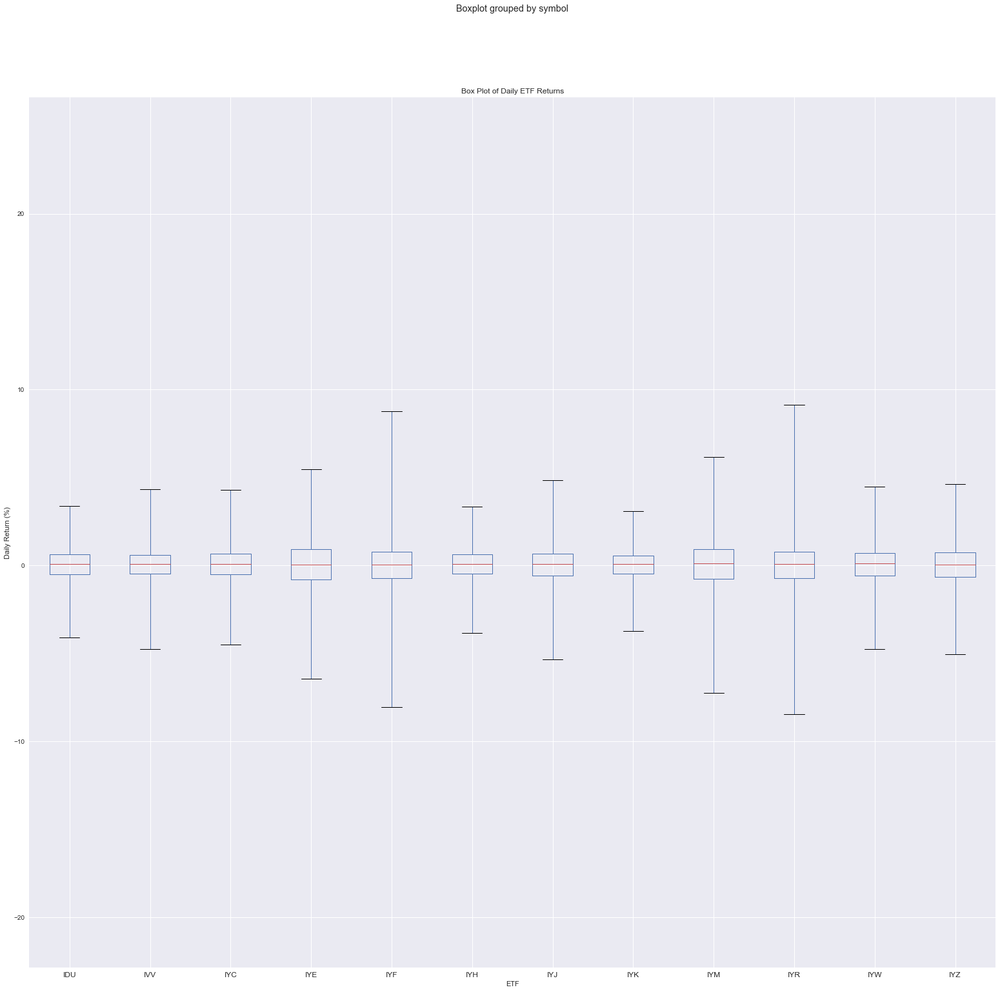

In [4]:
plt.figure(figsize=(150,70))
df_boxplot_data = df_etf_data[['symbol','PctChg']]
df_boxplot_data['PctChgPlot'] = df_boxplot_data['PctChg']*100
df_boxplot_data.boxplot(column='PctChgPlot',by='symbol',figsize=(26,25),whis=(0.5,99.5))
plt.title('Box Plot of Daily ETF Returns')
plt.xlabel('ETF')
plt.ylabel('Daily Return (%)')
plt.show()

In the above box plot, the whiskers are set at the 1st and 99th percentiles.

From the above chart, we can see that IYE (Energy), IYF (Financials), IYM (Materials) and IYR (Real Estate) are the riskier ETF's in relation to all ETF's. In particular, the Energy ETF has shown the some of largest daily gains and loses. We will be looking at the timing of some of the largest daily gains and losses below.

In [5]:
pd.set_option('display.max_rows', 100)
df_etf_data.groupby('symbol').agg(['mean','std'])['PctChg']

,mean,std
symbol,,
IDU,0.000153,0.011784
IVV,0.000283,0.012971
IYC,0.000391,0.012629
IYE,0.000237,0.019108
IYF,0.000139,0.020456
IYH,0.000360,0.011052
IYJ,0.000326,0.014260
IYK,0.000284,0.010318
IYM,0.000278,0.018631


The standard deviation above confirms the findings from the box plot. Note that a higher standard deviation does not necesarily indicate higher average return. We will dig a little bit deeper to see how these ETF's have fared over the years.

<h1>Statistics by Year</h1>

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


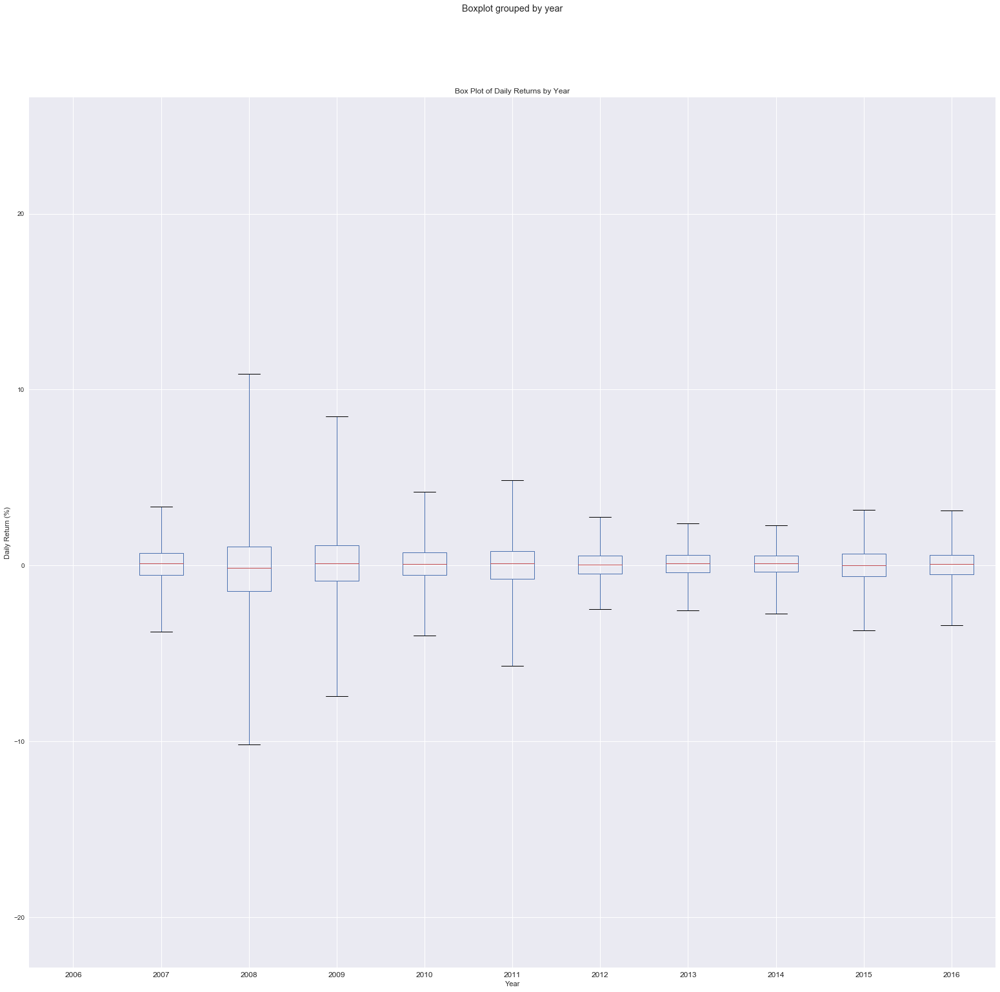

In [6]:
plt.figure(figsize=(150,70))
df_boxplot_data = df_etf_data[['year','PctChg']]
df_boxplot_data['PctChgPlot'] = df_boxplot_data['PctChg']*100
df_boxplot_data.boxplot(column='PctChgPlot',by='year',figsize=(26,25),whis=(0.5,99.5))
plt.title('Box Plot of Daily Returns by Year')
plt.xlabel('Year')
plt.ylabel('Daily Return (%)')
plt.show()

In [7]:
df_etf_data.groupby('year').agg(['mean','std'])['PctChg'][1:]

,mean,std
year,,
2007,0.000268,0.011842
2008,-0.001624,0.029992
2009,0.001158,0.022196
2010,0.000525,0.012911
2011,-0.000038,0.016020
2012,0.000470,0.009054
2013,0.000909,0.008383
2014,0.000534,0.008511
2015,0.000037,0.011197


The years with the highest volatility in daily returns were 2008 and 2009, both being part of the 2008-09 crash.

<h1>Statistics by Year and ETF</h1>

We will now look into statistics of daily returns by both the year and ETF.

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


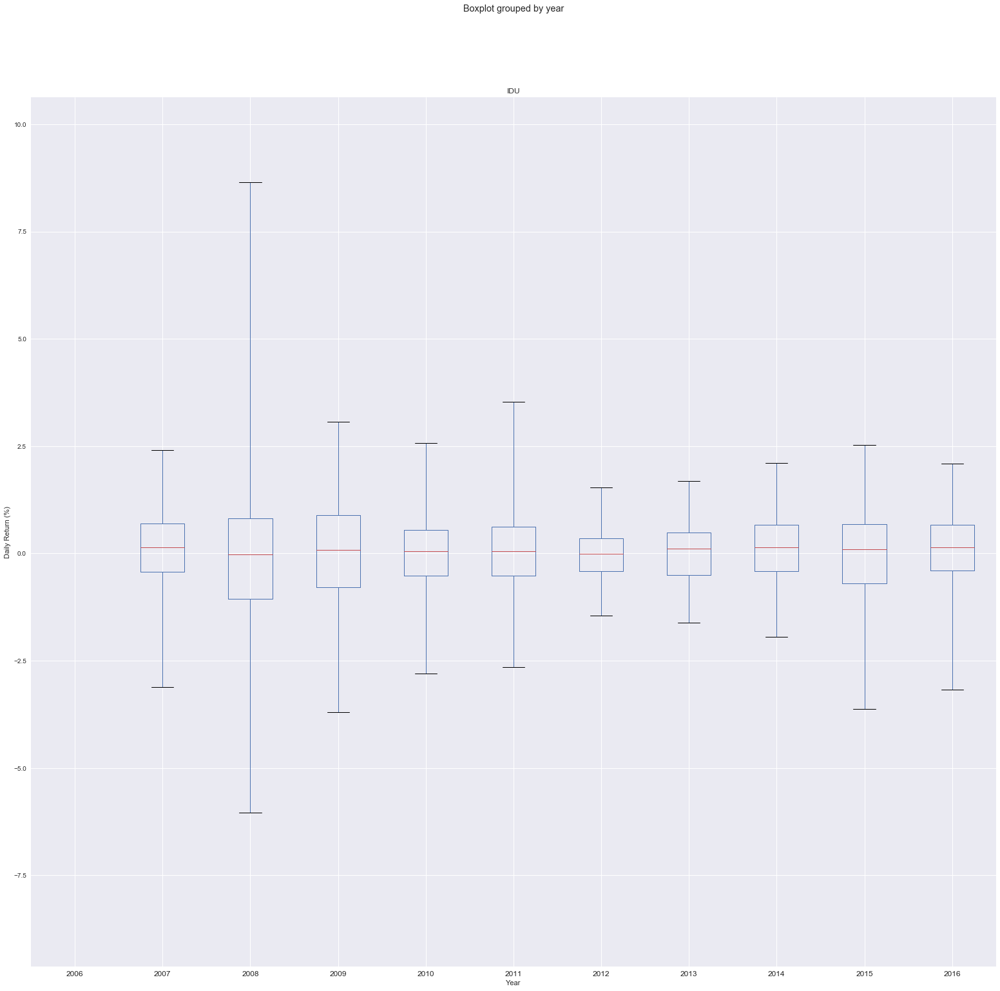

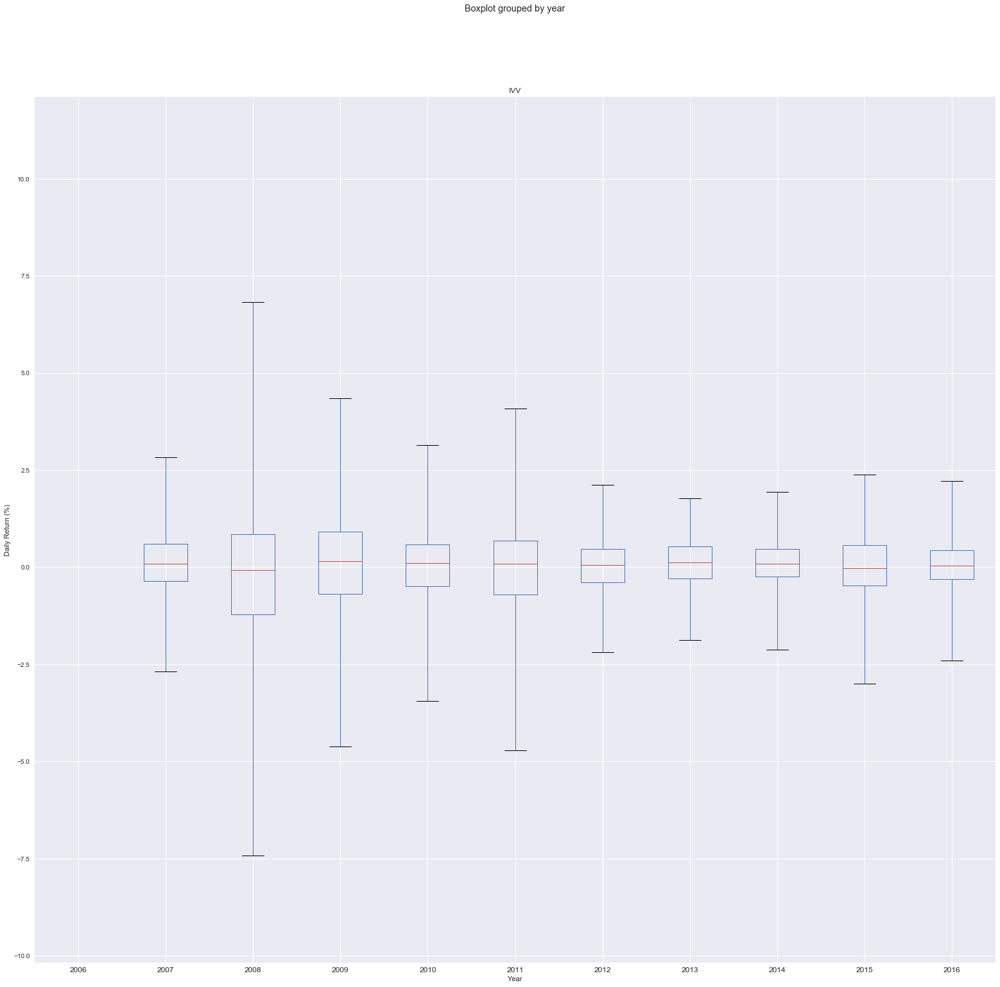

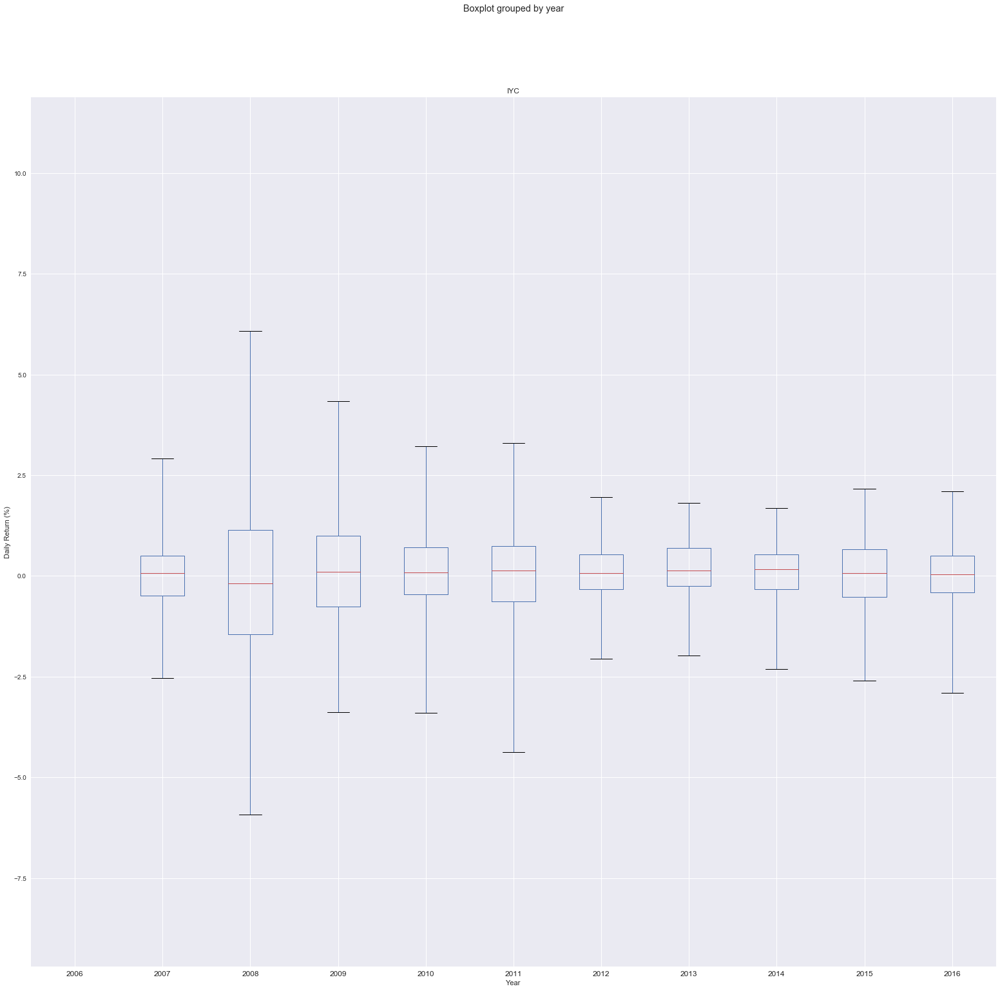

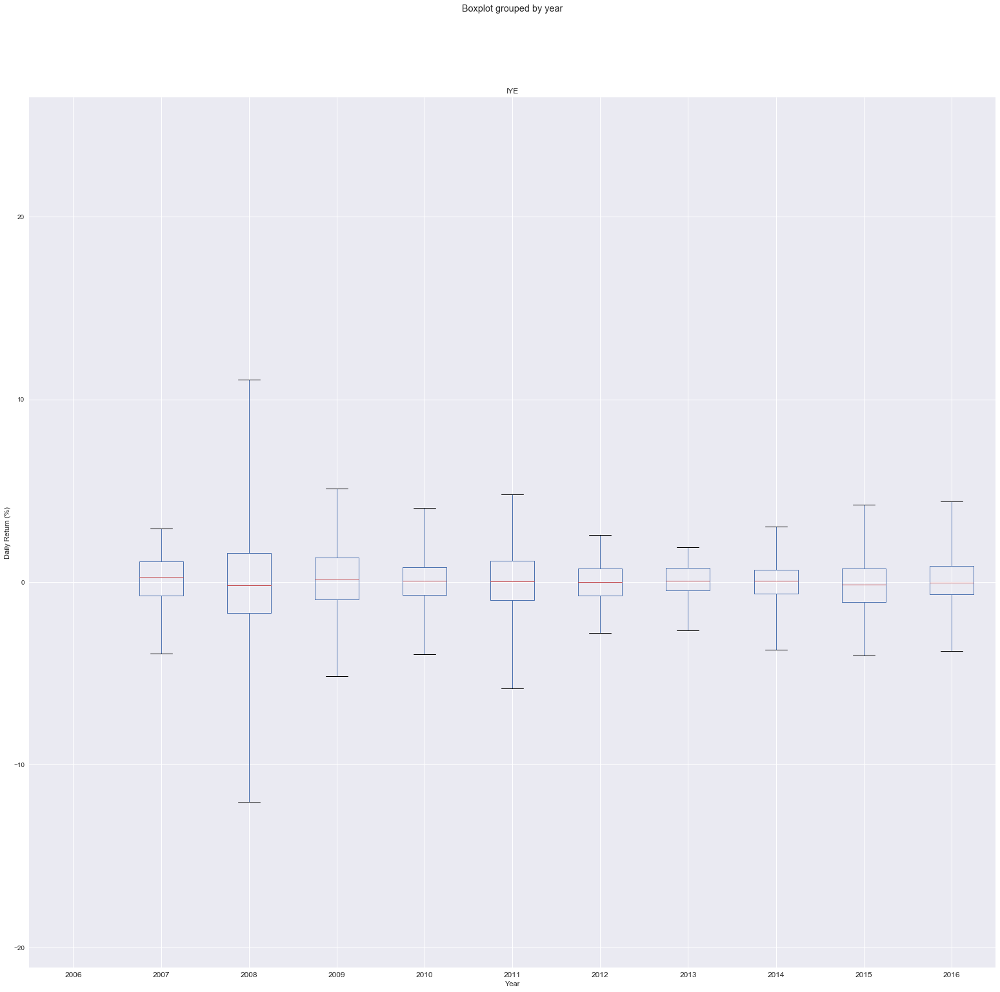

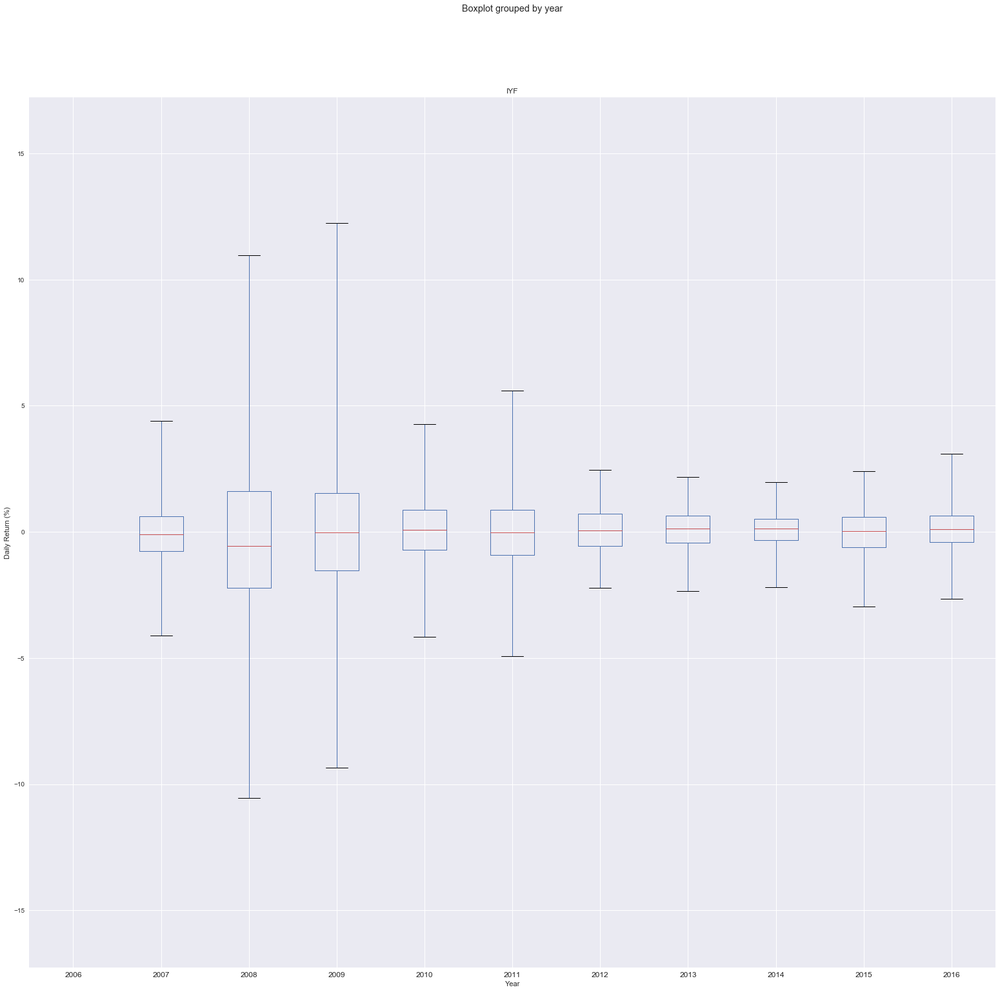

...

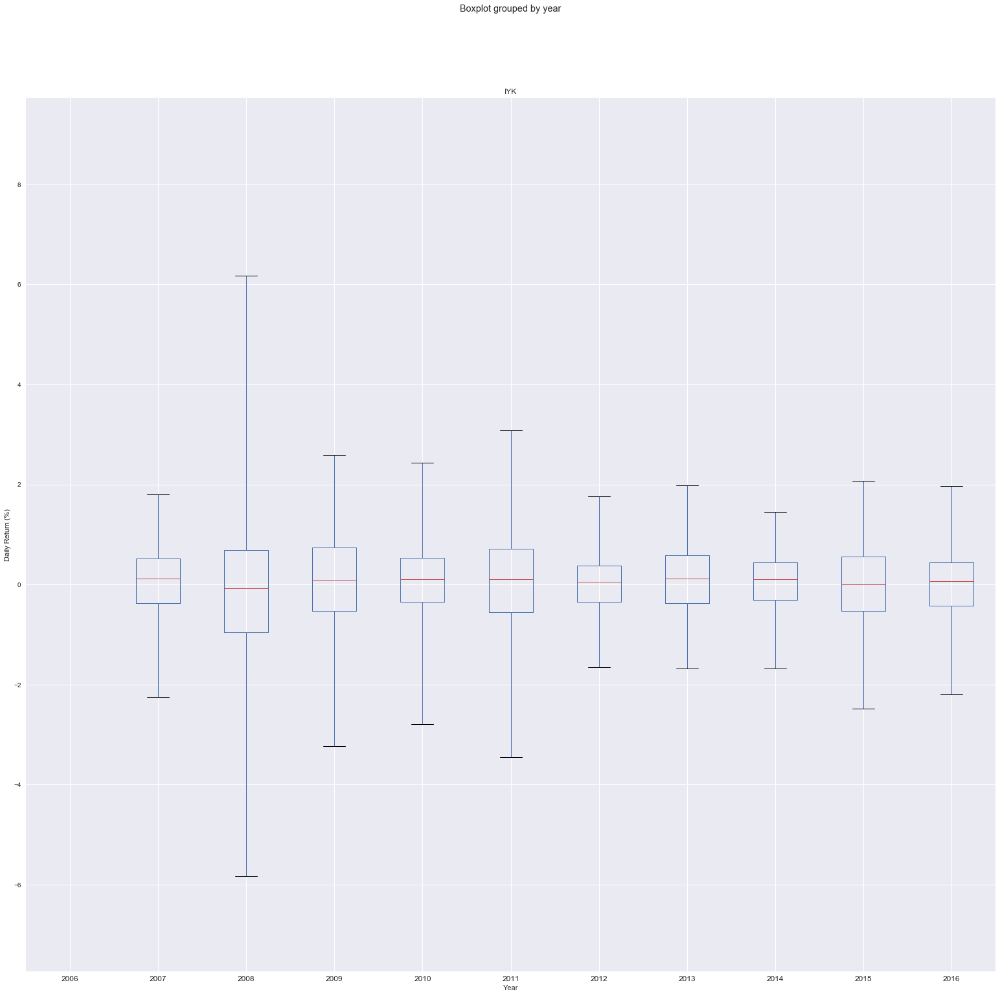

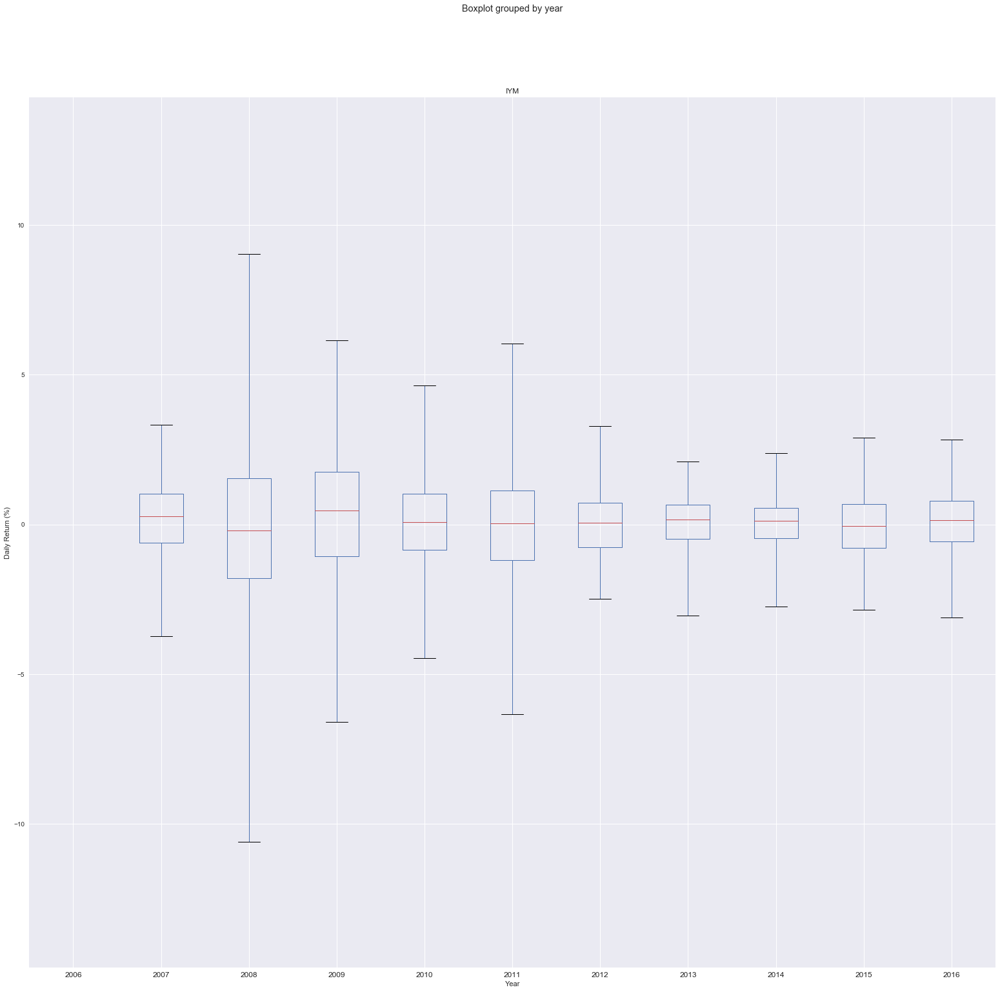

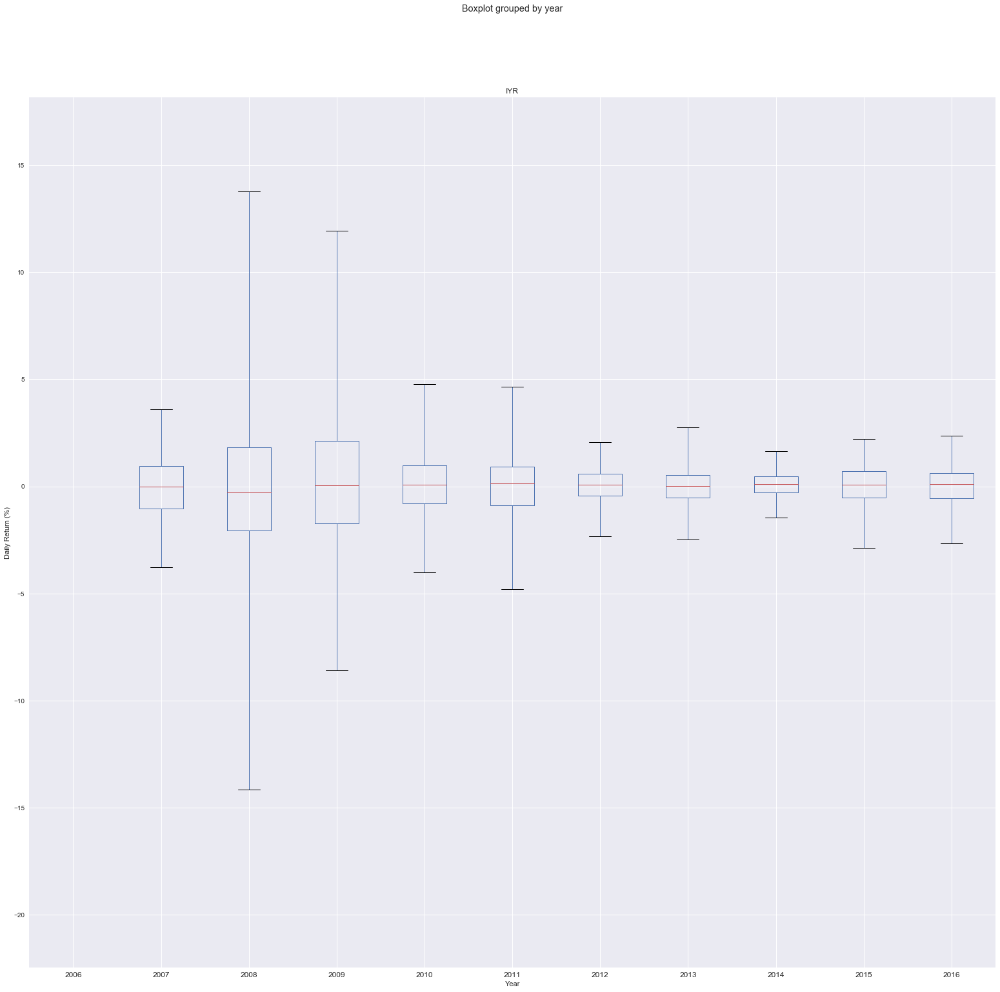

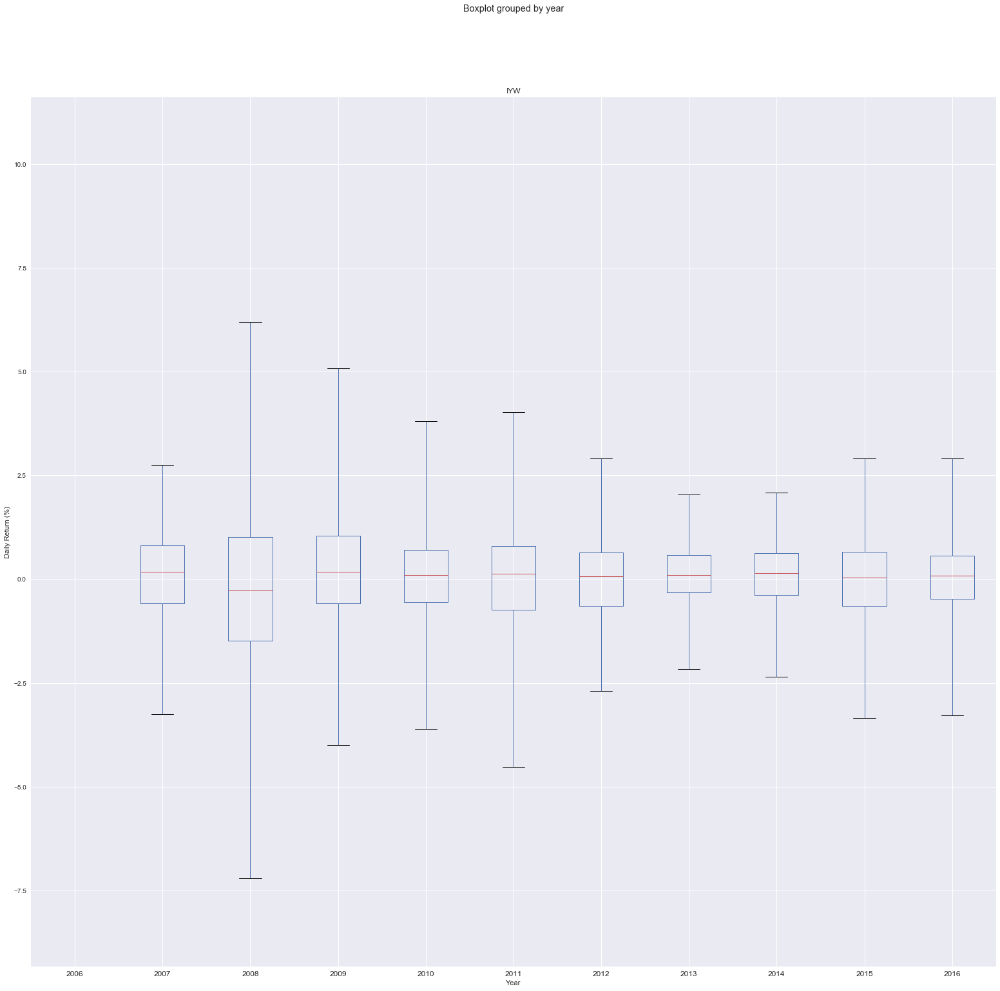

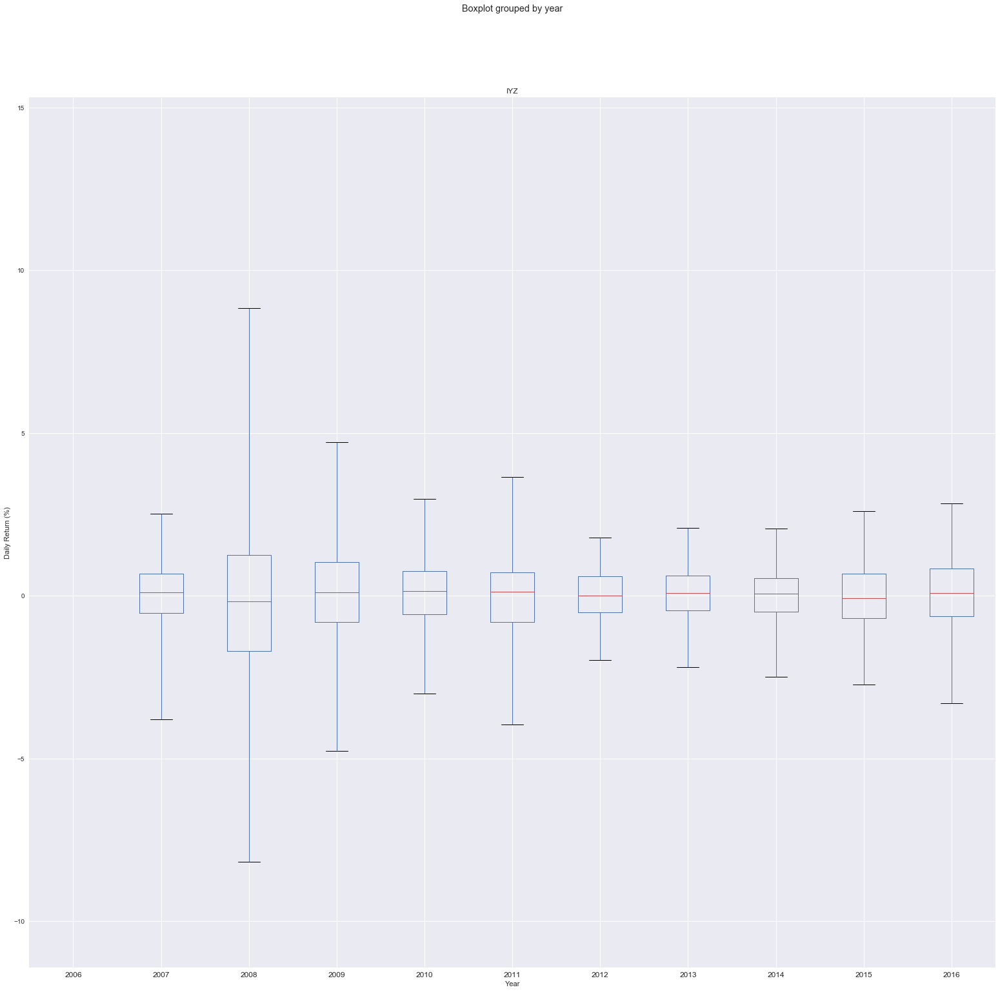

In [8]:
for name,group in groups_symbol:
    plt.figure(figsize=(150,70))
    group['PctChgPlot'] = group['PctChg']*100
    group.boxplot(column='PctChgPlot',by='year',figsize=(26,25),whis=(0.5,99.5))
    plt.title(name)
    plt.xlabel('Year')
    plt.ylabel('Daily Return (%)')
    plt.show()


IDU Descriptive Statistics
   year      mean       std
0  2007  0.000556  0.010795
1  2008 -0.001485  0.022282
2  2009  0.000383  0.013246
3  2010  0.000017  0.009738
4  2011  0.000516  0.010862
5  2012 -0.000118  0.006045
6  2013  0.000464  0.007812
7  2014  0.000943  0.008346
8  2015 -0.000274  0.011021
9  2016  0.000533  0.009840


/Users/Derek/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


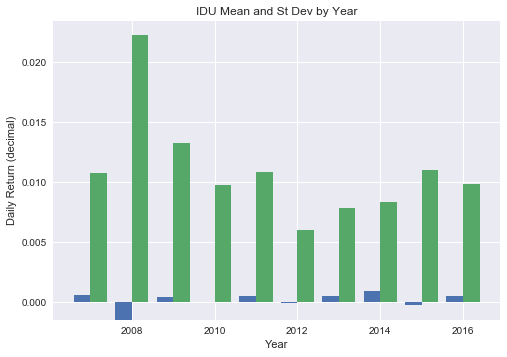


IVV Descriptive Statistics
   year      mean       std
0  2007  0.000172  0.010133
1  2008 -0.001716  0.024851
2  2009  0.001017  0.016903
3  2010  0.000594  0.011318
4  2011  0.000076  0.014642
5  2012  0.000503  0.008047
6  2013  0.001074  0.007090
7  2014  0.000589  0.007028
8  2015  0.000173  0.009850
9  2016  0.000361  0.008337


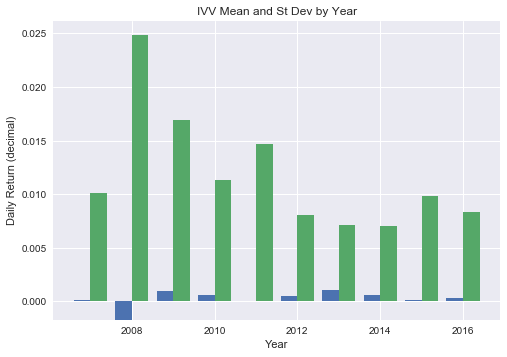


IYC Descriptive Statistics
   year      mean       std
0  2007 -0.000301  0.009683
1  2008 -0.001231  0.023656
2  2009  0.001157  0.016087
3  2010  0.000732  0.011423
4  2011  0.000167  0.014022
5  2012  0.000777  0.007908
6  2013  0.001409  0.007511
7  2014  0.000618  0.007975
8  2015  0.000412  0.009835
9  2016  0.000179  0.008595


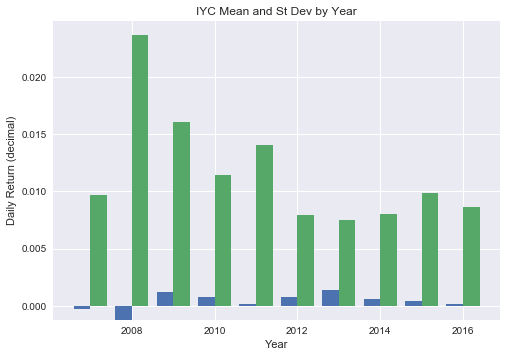


IYE Descriptive Statistics
   year      mean       std
0  2007  0.001292  0.014602
1  2008 -0.001444  0.039114
2  2009  0.000907  0.021417
3  2010  0.000599  0.014469
4  2011  0.000089  0.019462
5  2012  0.000149  0.011376
6  2013  0.000877  0.009043
7  2014 -0.000293  0.012213
8  2015 -0.000776  0.015899
9  2016  0.000977  0.015842


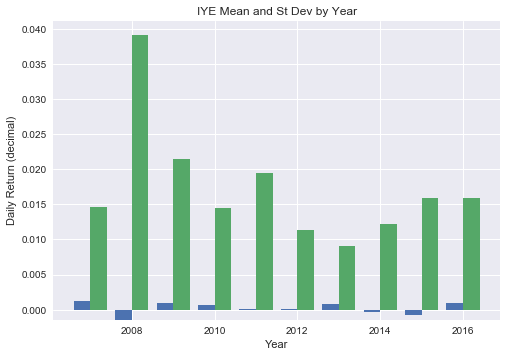


IYF Descriptive Statistics
   year      mean       std
0  2007 -0.000764  0.014362
1  2008 -0.002090  0.039782
2  2009  0.001235  0.036075
3  2010  0.000345  0.015179
4  2011 -0.000641  0.019843
5  2012  0.000888  0.010106
6  2013  0.001069  0.008811
7  2014  0.000661  0.007658
8  2015  0.000100  0.010494
9  2016  0.000595  0.010881


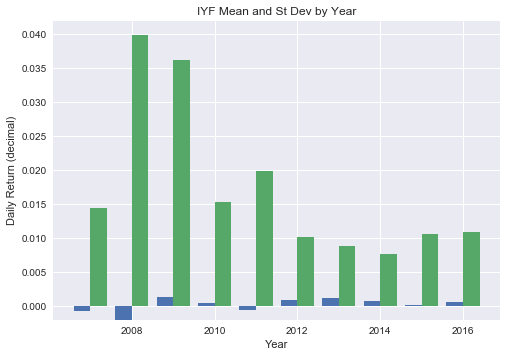


IYH Descriptive Statistics
   year      mean       std
0  2007  0.000311  0.007568
1  2008 -0.000991  0.018411
2  2009  0.000742  0.012404
3  2010  0.000054  0.009398
4  2011  0.000332  0.012516
5  2012  0.000629  0.007049
6  2013  0.001385  0.007771
7  2014  0.000928  0.009092
8  2015  0.000419  0.011484
9  2016 -0.000193  0.009994


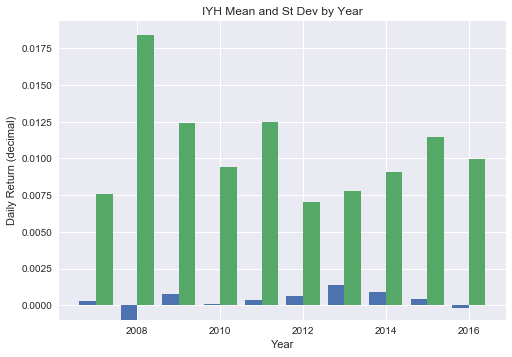


IYJ Descriptive Statistics
   year      mean       std
0  2007  0.000527  0.010059
1  2008 -0.001825  0.024885
2  2009  0.000923  0.019992
3  2010  0.000752  0.013684
4  2011 -0.000113  0.017375
5  2012  0.000628  0.009573
6  2013  0.001329  0.008255
7  2014  0.000387  0.008527
8  2015  0.000022  0.010029
9  2016  0.000643  0.009352


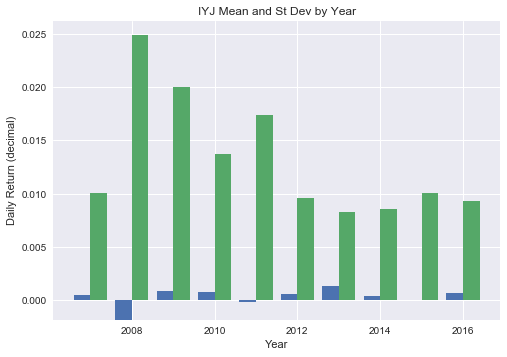


IYK Descriptive Statistics
   year      mean       std
0  2007  0.000327  0.007776
1  2008 -0.001163  0.019260
2  2009  0.000732  0.011638
3  2010  0.000572  0.009018
4  2011  0.000176  0.011447
5  2012  0.000364  0.006729
6  2013  0.000996  0.007355
7  2014  0.000467  0.006387
8  2015  0.000286  0.009037
9  2016  0.000089  0.007900


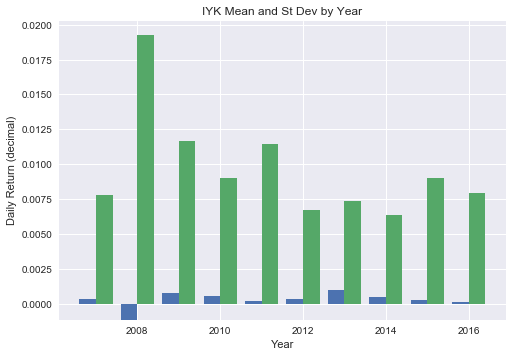


IYM Descriptive Statistics
   year      mean       std
0  2007  0.001107  0.014202
1  2008 -0.002301  0.035474
2  2009  0.002175  0.025034
3  2010  0.000935  0.017361
4  2011 -0.000664  0.021112
5  2012  0.000298  0.012456
6  2013  0.000710  0.009794
7  2014  0.000225  0.009227
8  2015 -0.000392  0.012212
9  2016  0.000703  0.012028


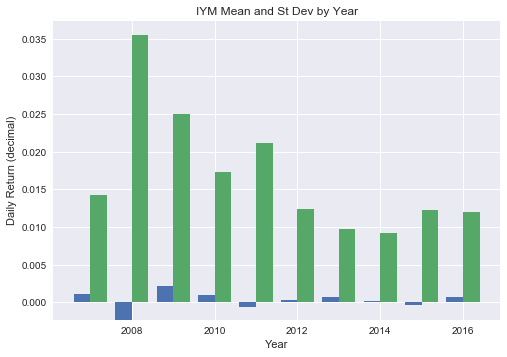


IYR Descriptive Statistics
   year      mean       std
0  2007 -0.000742  0.016222
1  2008 -0.001293  0.044814
2  2009  0.001793  0.039120
3  2010  0.000674  0.016414
4  2011  0.000121  0.017752
5  2012  0.000489  0.008034
6  2013 -0.000126  0.009649
7  2014  0.000915  0.006326
8  2015  0.000048  0.010283
9  2016  0.000160  0.010413


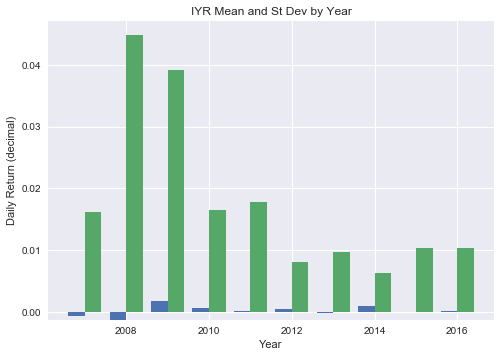


IYW Descriptive Statistics
   year      mean       std
0  2007  0.000648  0.011445
1  2008 -0.001957  0.024680
2  2009  0.001944  0.016758
3  2010  0.000438  0.012661
4  2011 -0.000054  0.015234
5  2012  0.000410  0.010469
6  2013  0.000943  0.008298
7  2014  0.000895  0.008700
8  2015  0.000281  0.011715
9  2016  0.000455  0.010754


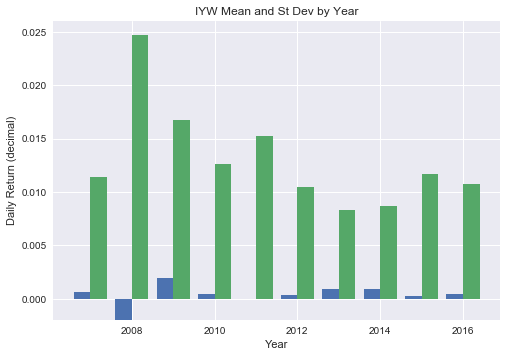


IYZ Descriptive Statistics
   year      mean       std
0  2007  0.000084  0.011724
1  2008 -0.001993  0.029043
2  2009  0.000888  0.017986
3  2010  0.000584  0.011218
4  2011 -0.000464  0.014333
5  2012  0.000622  0.008675
6  2013  0.000782  0.008760
7  2014  0.000074  0.009126
8  2015  0.000151  0.011145
9  2016  0.000678  0.012289


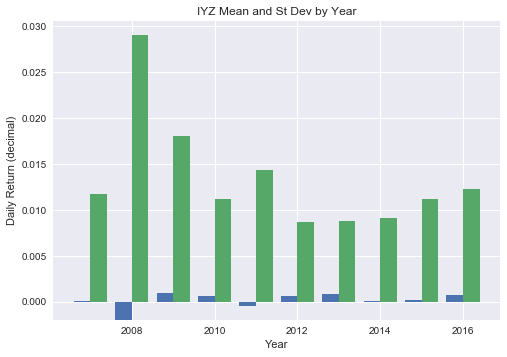

In [42]:
for name,group in groups_symbol:
    if(len(group)>1):
        print(name,'Descriptive Statistics')
        df_barchart_data = group.groupby('year').agg(['mean','std'])['PctChg'][1:].reset_index()
        print(df_barchart_data)
        ax = plt.subplot(111)
        plt.legend(loc='upper left')
        ax.bar(df_barchart_data.year-0.2,df_barchart_data['mean'],width=0.4,label='mean')
        ax.bar(df_barchart_data.year+0.2,df_barchart_data['std'],width=0.4,label='std')
        title = str(name) + ' Mean and St Dev by Year'
        plt.title(title)
        plt.xlabel('Year')
        plt.ylabel('Daily Return (decimal)')
        plt.show()
        print()

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


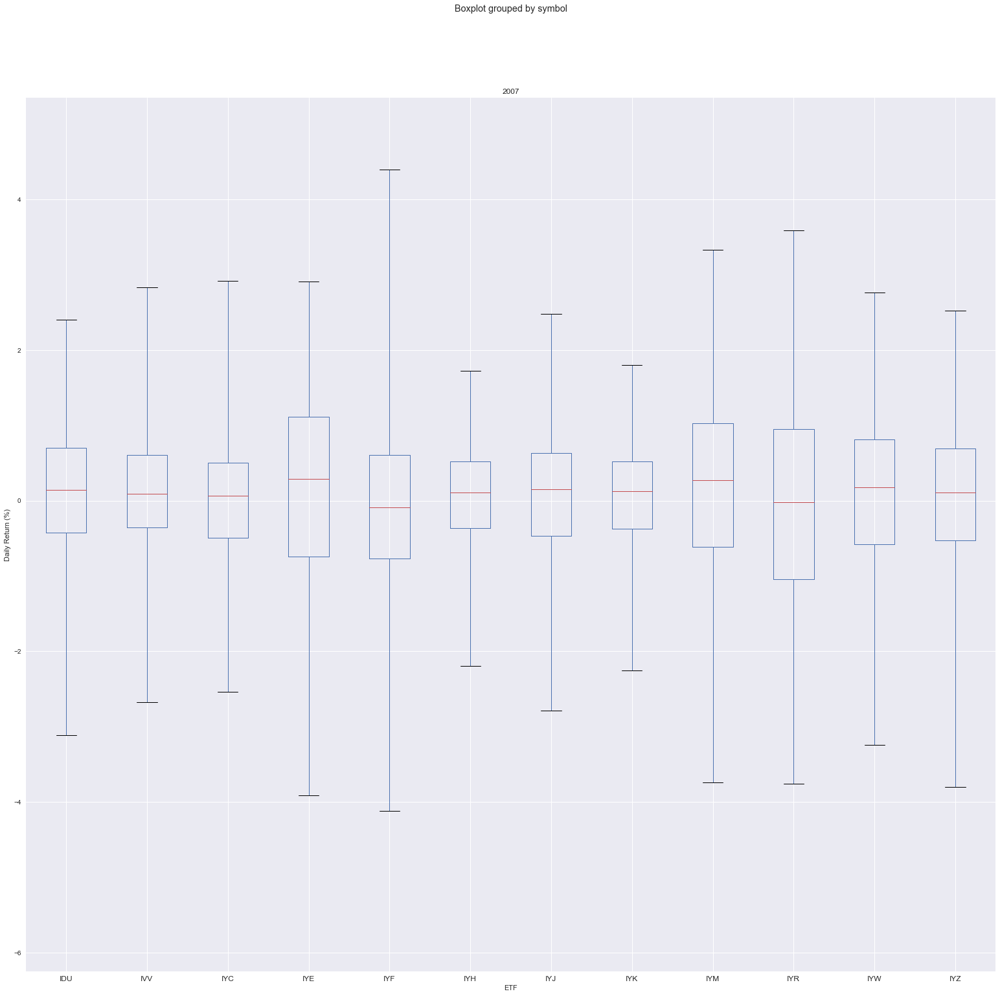

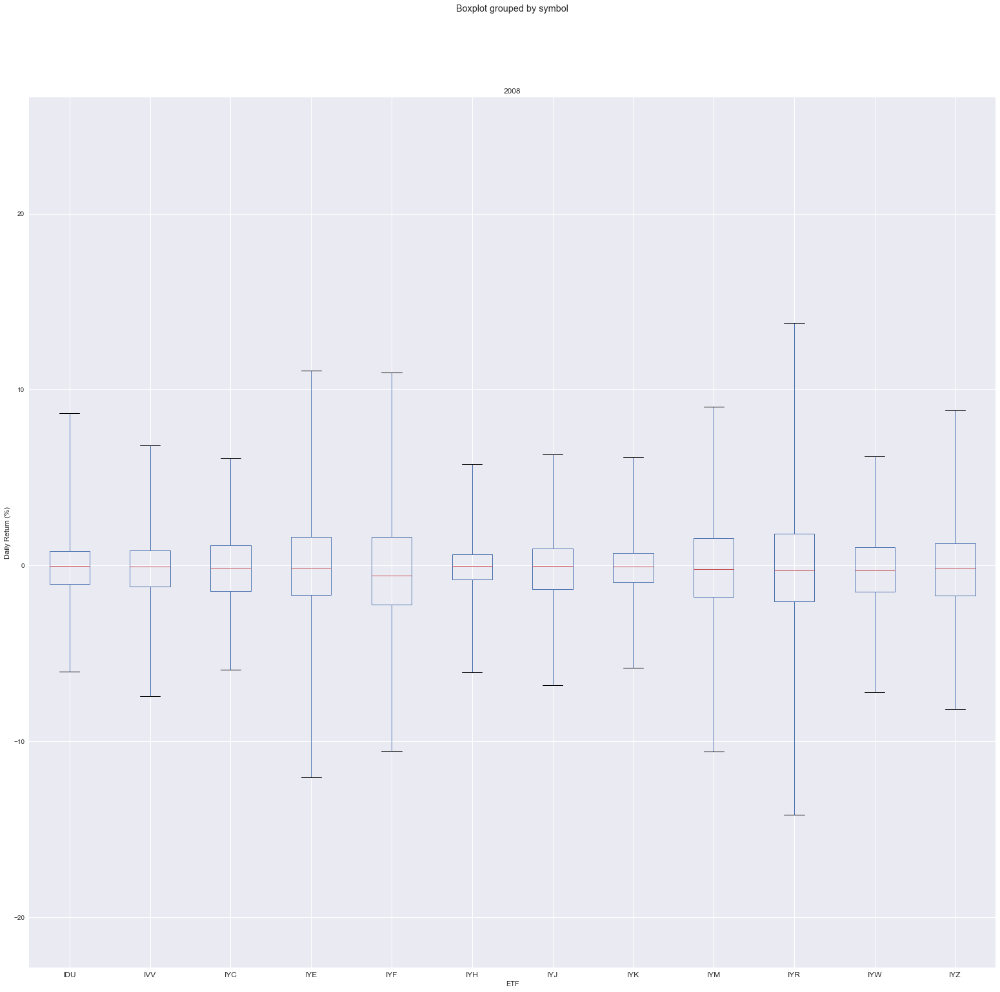

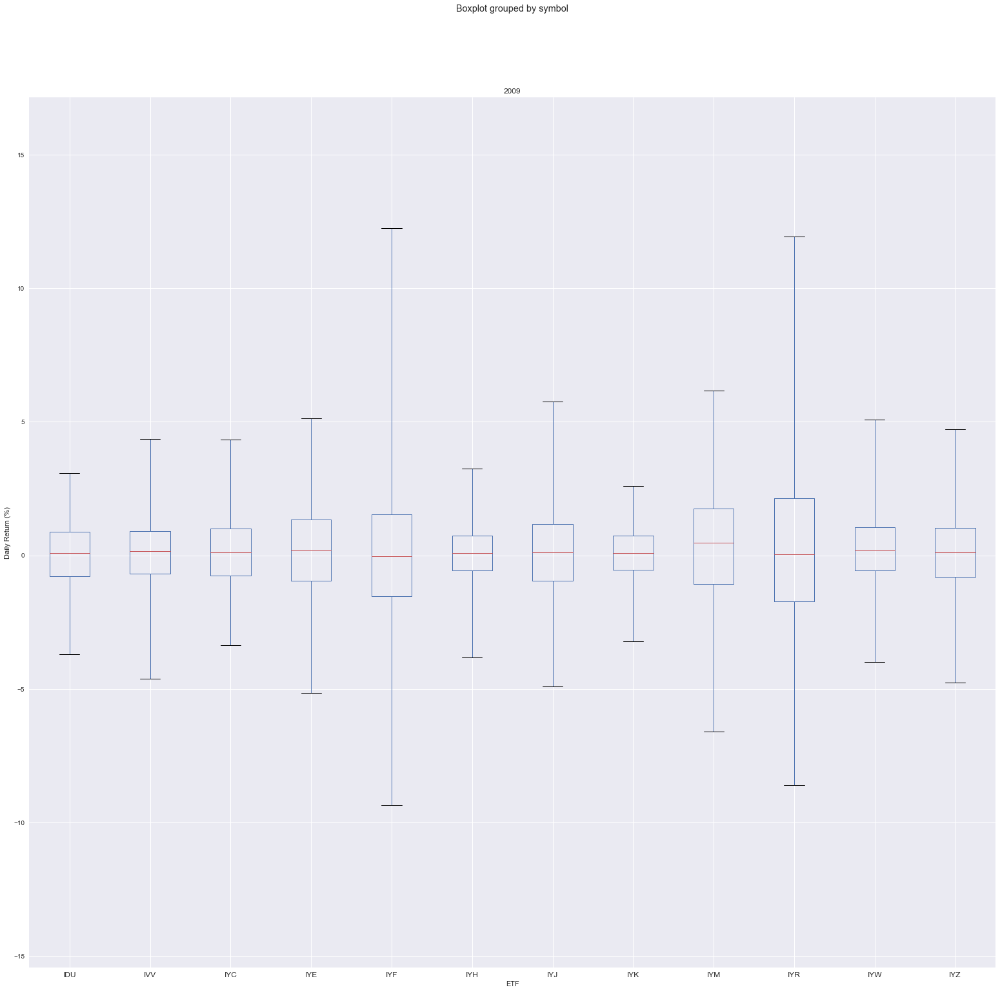

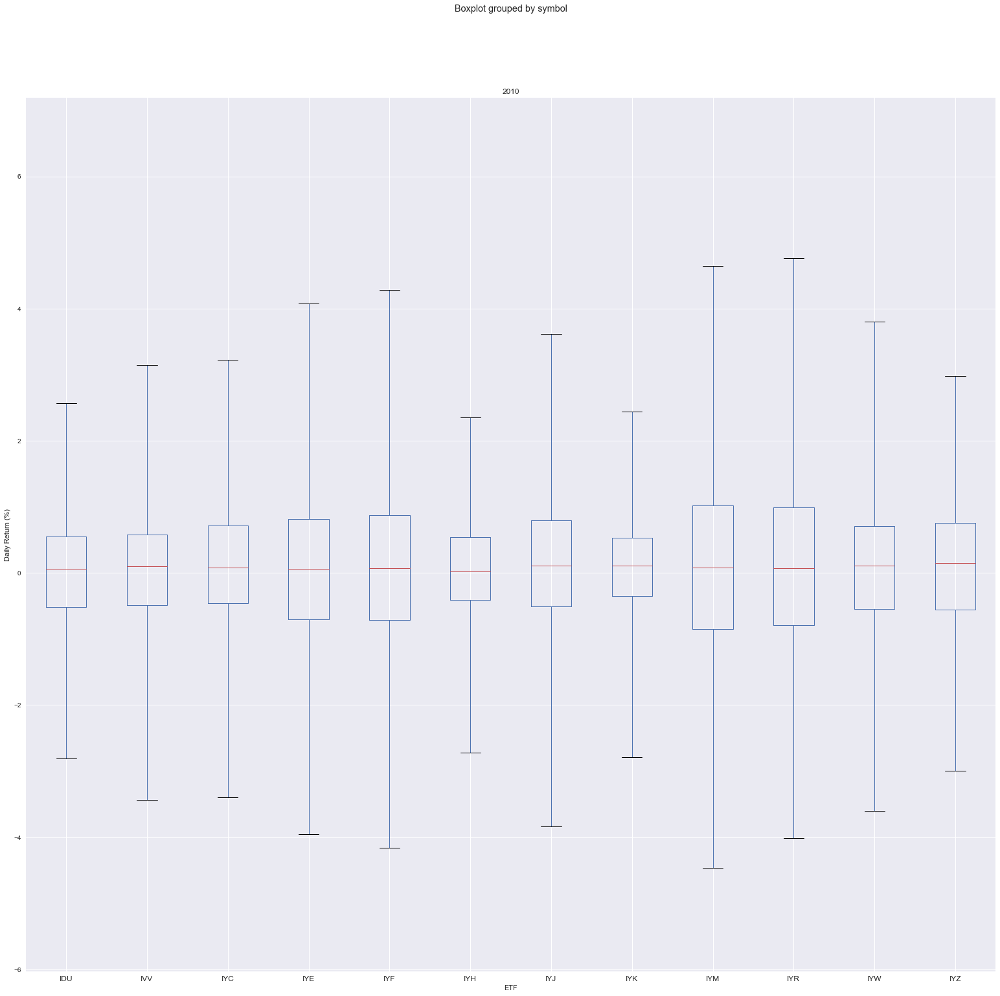

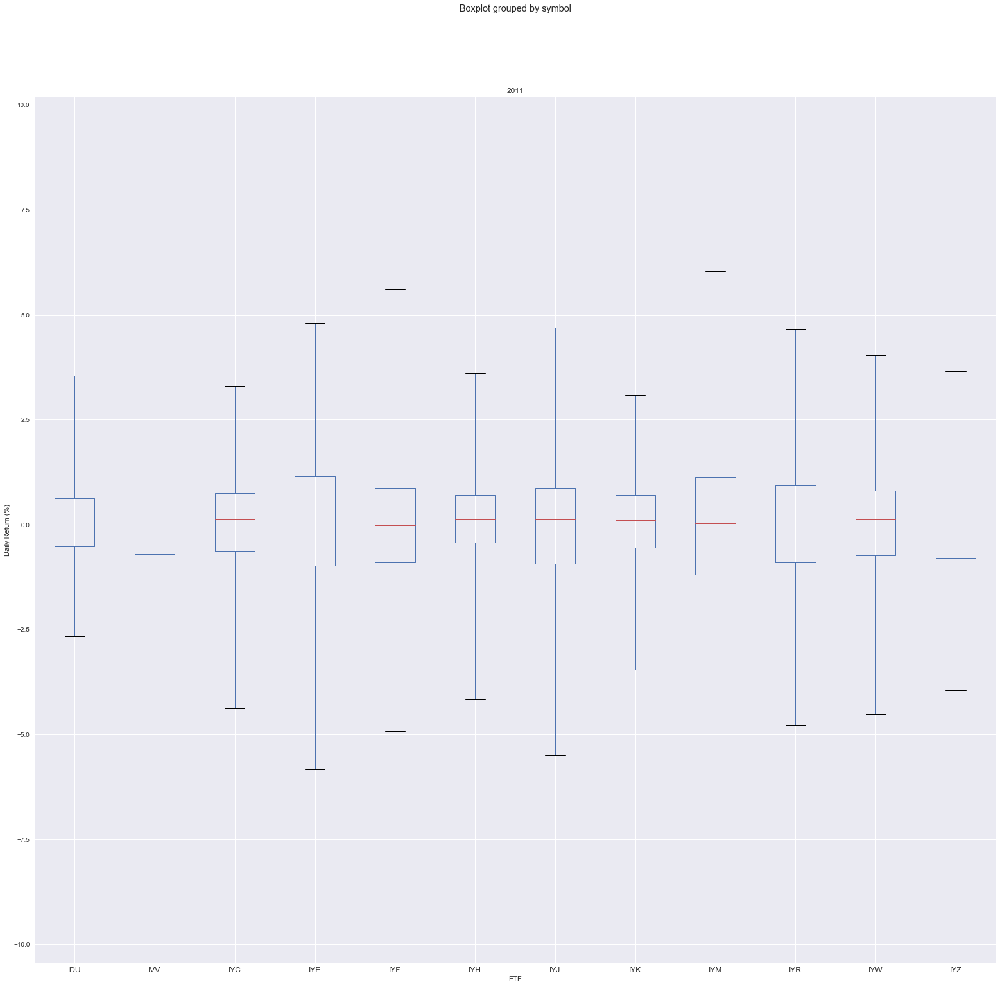

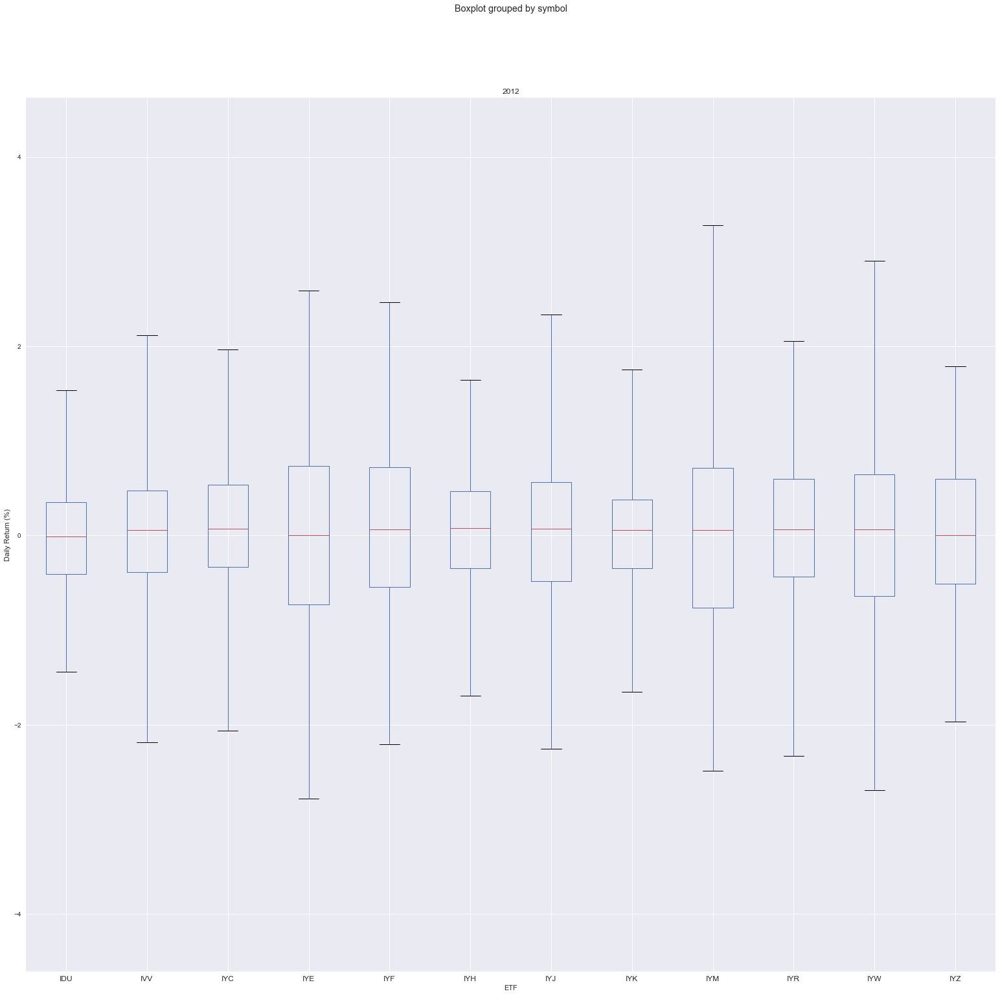

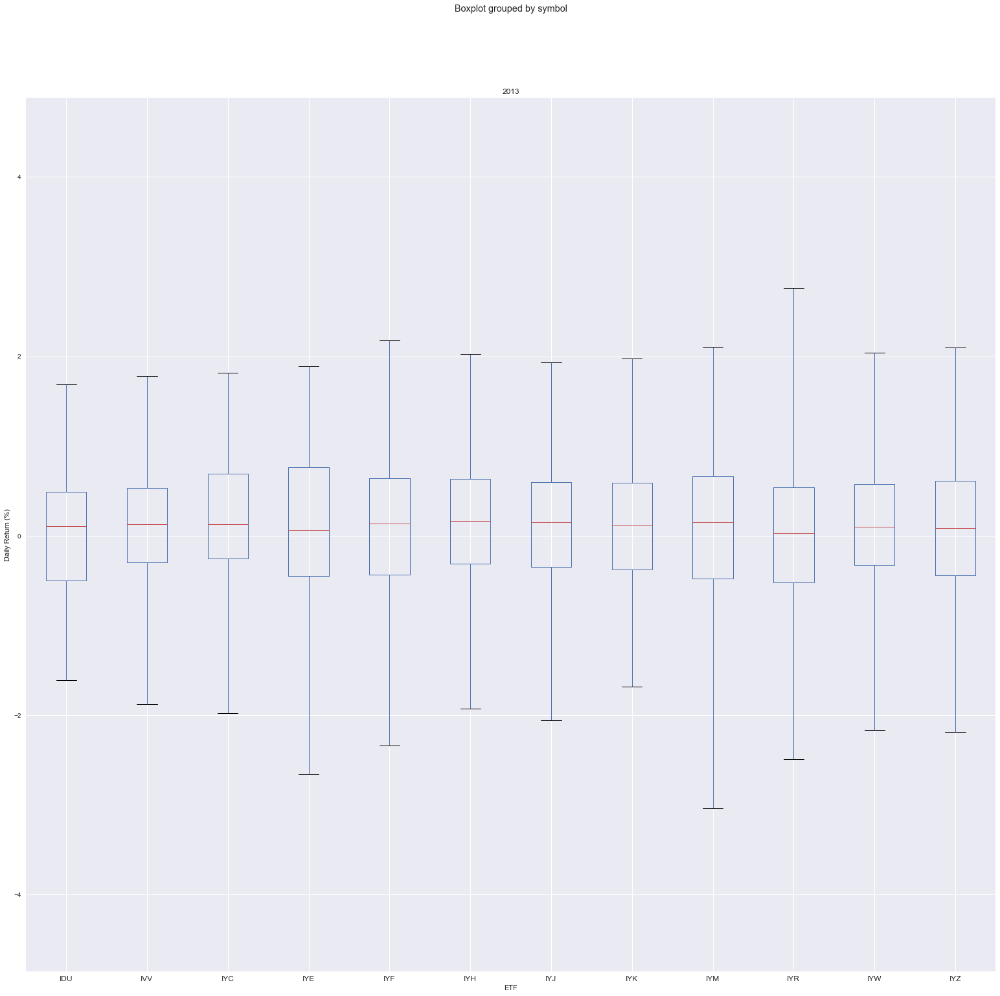

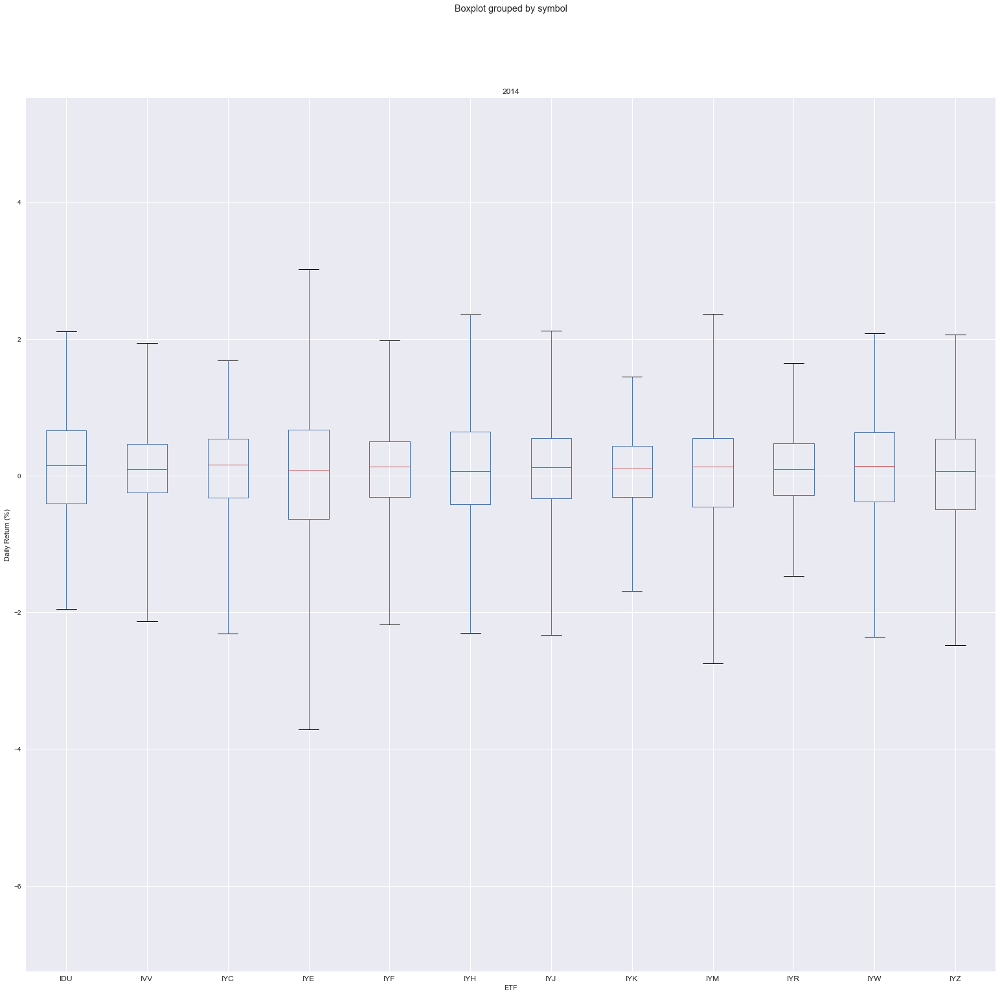

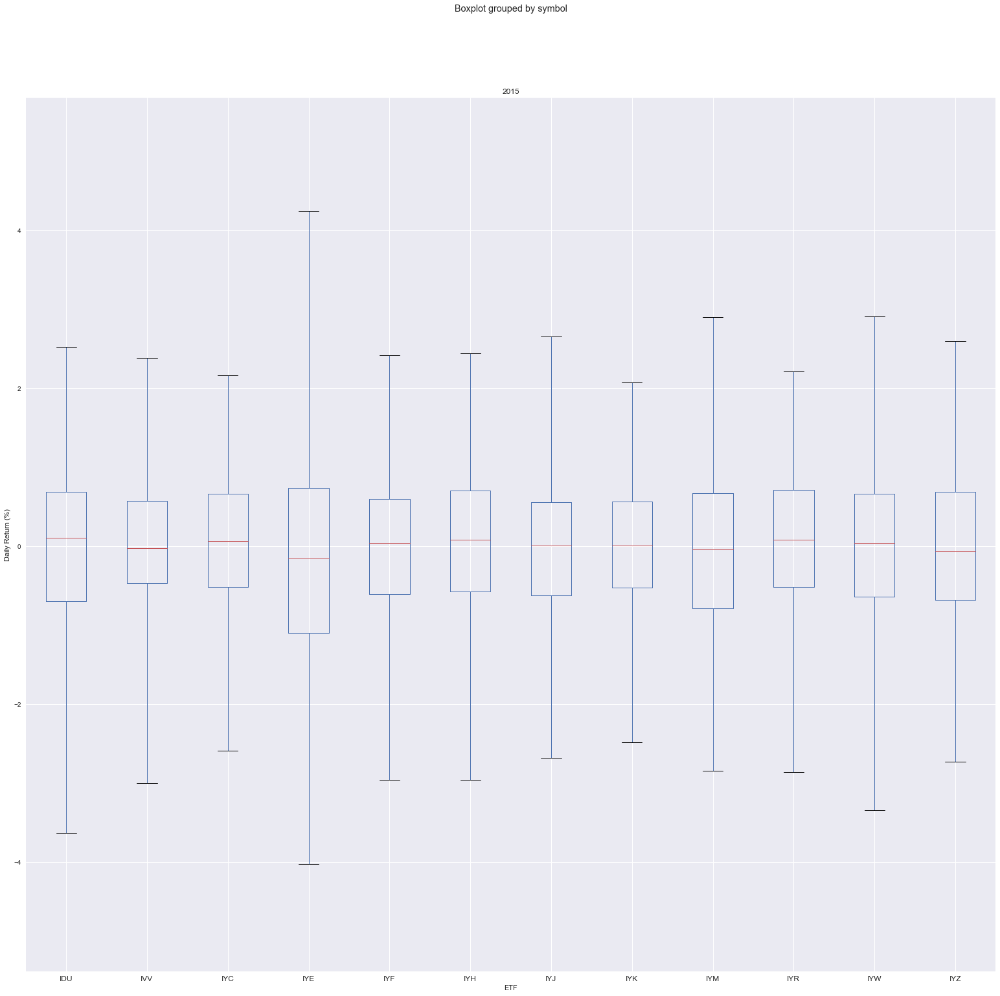

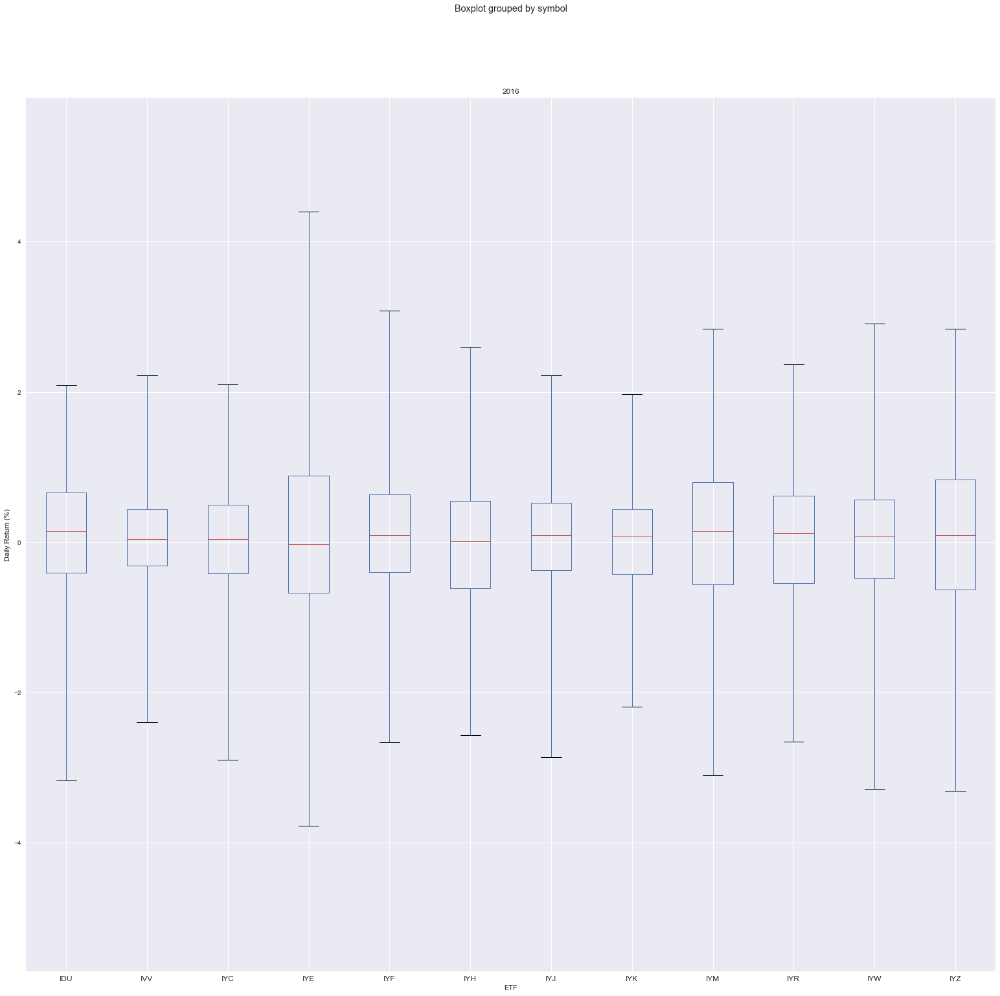

In [9]:
for name,group in groups_year:
    if(len(group)>len(symbols)):
        group['PctChgPlot'] = group['PctChg']*100
        group.boxplot(column='PctChgPlot',by='symbol',figsize=(26,25),whis=(0.5,99.5))
        plt.title(name.year)
        plt.xlabel('ETF')
        plt.ylabel('Daily Return (%)')
        plt.show()



In [45]:
#for name,group in groups_year:
#    if(len(group)>len(symbols)):
#        print(name.year,'Descriptive Statistics')
#        print(group.groupby('symbol').agg(['mean','std'])['PctChg'])

        
for name,group in groups_year:
    if(len(group)>len(symbols)):
        print(name.year,'Descriptive Statistics')
        df_barchart_data = group.groupby('symbol').agg(['mean','std'])['PctChg'][1:].reset_index()
        print(df_barchart_data)
        ax = plt.subplot(111)
        plt.legend(loc='upper left')
        ax.bar(df_barchart_data['symbol'].unstack()-0.2,df_barchart_data['mean'],width=0.4,label='mean')
        ax.bar(df_barchart_data['symbol'].unstack()+0.2,df_barchart_data['std'],width=0.4,label='std')
        title = str(name.year) + ' Mean and St Dev by ETF'
        plt.title(title)
        plt.xlabel('ETF')
        plt.ylabel('Daily Return (decimal)')
        plt.show()
        print()


2007 Descriptive Statistics
   symbol      mean       std
0     IVV  0.000172  0.010133
1     IYC -0.000301  0.009683
2     IYE  0.001292  0.014602
3     IYF -0.000764  0.014362
4     IYH  0.000311  0.007568
5     IYJ  0.000527  0.010059
6     IYK  0.000327  0.007776
7     IYM  0.001107  0.014202
8     IYR -0.000742  0.016222
9     IYW  0.000648  0.011445
10    IYZ  0.000084  0.011724


/Users/Derek/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


AttributeError: 'RangeIndex' object has no attribute 'labels'

<h1>More Detailed Analysis</h1>

We will now determine when the largest daily returns occurred.

In [39]:
pd.set_option('display.max_rows', 500)
df_etf_data[df_etf_data['PctChg']<-0.05]

,symbol,dateYYMD,PctChg,adjclose,amount,close,data,date,denominator,high,low,numerator,open,splitRatio,type,volume
446,IVV,2008-09-30,-0.074242,93.140396,NaN,112.349998,NaN,1222695000,NaN,119.500000,111.070000,NaN,119.330002,NaN,NaN,12131900.0
452,IVV,2008-10-08,-0.058073,83.233597,NaN,100.400002,NaN,1223386200,NaN,107.519997,99.599998,NaN,106.989998,NaN,NaN,10833500.0
454,IVV,2008-10-10,-0.065969,76.178627,NaN,91.889999,NaN,1223559000,NaN,100.809998,91.099998,NaN,99.849998,NaN,NaN,16950800.0
458,IVV,2008-10-16,-0.091646,75.266724,NaN,90.790001,NaN,1224077400,NaN,97.940002,90.690002,NaN,97.889999,NaN,NaN,8677300.0
463,IVV,2008-10-23,-0.054724,74.893661,NaN,90.339996,NaN,1224682200,NaN,93.680000,87.739998,NaN,93.400002,NaN,NaN,8730300.0
474,IVV,2008-11-07,-0.051742,75.357903,NaN,90.900002,NaN,1225981800,NaN,95.589996,90.290001,NaN,94.739998,NaN,NaN,8329500.0
483,IVV,2008-11-20,-0.056464,67.465645,NaN,81.379997,NaN,1227105000,NaN,87.010002,81.080002,NaN,86.070000,NaN,NaN,10613600.0
484,IVV,2008-11-21,-0.066232,62.997227,NaN,75.989998,NaN,1227191400,NaN,82.639999,75.209999,NaN,80.309998,NaN,NaN,18043400.0
490,IVV,2008-12-02,-0.087439,68.178612,NaN,82.239998,NaN,1228141800,NaN,87.709999,82.110001,NaN,87.660004,NaN,NaN,16389400.0
524,IVV,2009-01-21,-0.052681,67.448471,NaN,80.739998,NaN,1232461800,NaN,84.690002,80.660004,NaN,84.430000,NaN,NaN,6411400.0


Most of the large daily losses occured during the 2008-09 crash between late 2008 and early 2009. In addition, Real Estate, Materials and Financials saw large losses occur prior to the main 2008-09 crash (both before and after the S&P500 suffered its largest losses).

There was also the Black Monday 2011 on August 8, 2011 that had triggered a larger daily loss there as well.d

In [114]:
df_etf_data[df_etf_data['PctChg']>0.050]

,symbol,dateYYMD,PctChg,adjclose,amount,close,data,date,denominator,high,low,numerator,open,splitRatio,type,volume
456,IVV,2008-10-14,0.102842,83.656418,NaN,100.910004,NaN,1223904600,NaN,101.010002,93.339996,NaN,94.169998,NaN,NaN,6510500.0
467,IVV,2008-10-29,0.110993,78.085388,NaN,94.190002,NaN,1225200600,NaN,94.330002,84.720001,NaN,87.589996,NaN,NaN,9834100.0
479,IVV,2008-11-14,0.068174,75.987968,NaN,91.660004,NaN,1226586600,NaN,91.820000,82.260002,NaN,86.279999,NaN,NaN,13220400.0
485,IVV,2008-11-22,0.058955,66.711235,NaN,80.470001,NaN,1227277800,NaN,80.660004,74.500000,NaN,77.610001,NaN,NaN,15983000.0
486,IVV,2008-11-25,0.054927,70.375519,NaN,84.889999,NaN,1227537000,NaN,87.169998,81.339996,NaN,82.120003,NaN,NaN,17197600.0
558,IVV,2009-03-11,0.061299,60.456364,NaN,72.370003,NaN,1236691800,NaN,72.500000,69.489998,NaN,69.660004,NaN,NaN,8714700.0
567,IVV,2009-03-24,0.072868,69.369843,NaN,83.040001,NaN,1237815000,NaN,83.050003,79.160004,NaN,79.589996,NaN,NaN,8836400.0
1178,IVV,2011-08-10,0.051496,104.083916,NaN,118.430000,NaN,1312896600,NaN,118.430000,110.660004,NaN,114.500000,NaN,NaN,12599000.0
2830,IYR,2008-01-24,0.081790,43.558880,NaN,66.000000,NaN,1201098600,NaN,66.639999,59.450001,NaN,59.450001,NaN,NaN,23458200.0
2863,IYR,2008-03-12,0.071069,42.073902,NaN,63.750000,NaN,1205242200,NaN,63.750000,60.820000,NaN,61.200001,NaN,NaN,13369800.0


Much of the largest daily gains occurred during the same period as the largest daily losses during the 2008-09 crash.

/Users/Derek/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


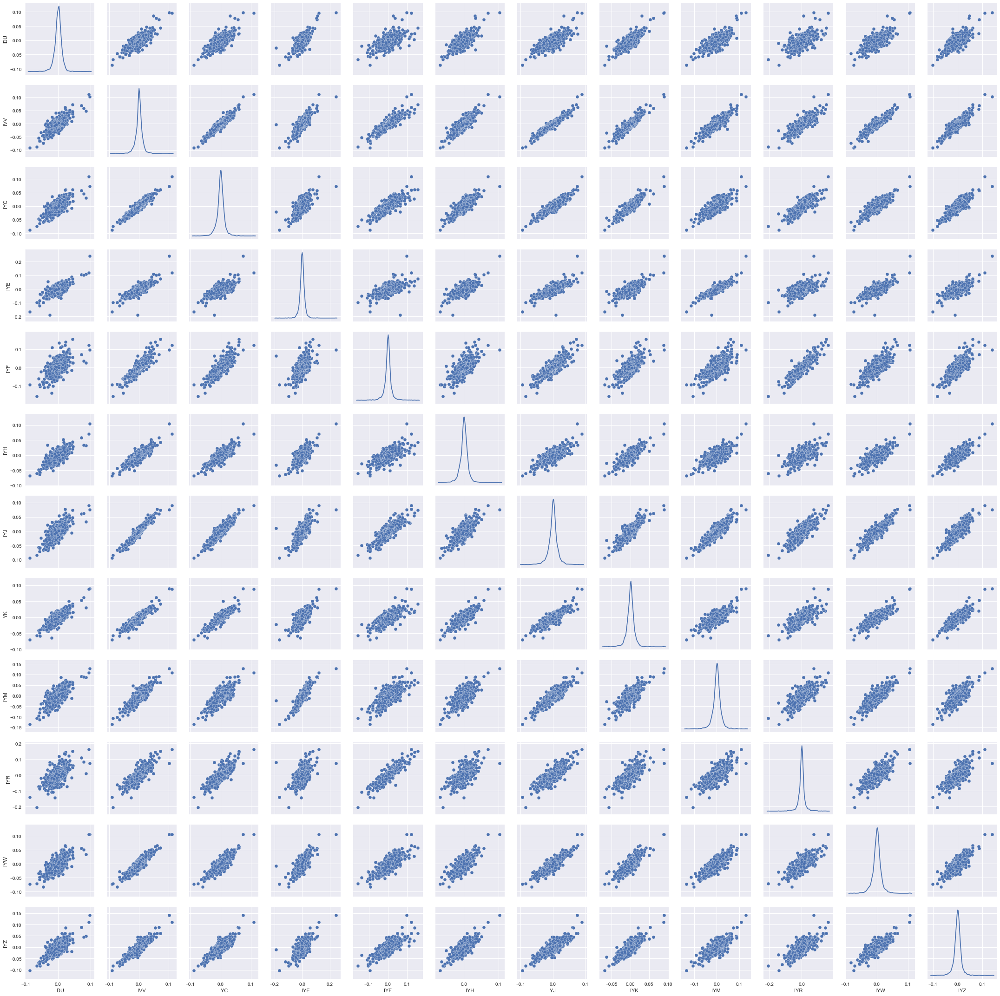

In [4]:
df_daily_returns = df_etf_data.pivot_table(values='PctChg',index='dateYYMD',columns='symbol')
df_daily_returns = df_daily_returns.dropna()
sns.pairplot(df_daily_returns,diag_kind='kde')
#plt.title('Pair plots of ETF Daily Returns')
plt.show()

In [5]:
df_daily_returns.corr()

symbol,IDU,IVV,IYC,IYE,IYF,IYH,IYJ,IYK,IYM,IYR,IYW,IYZ
symbol,,,,,,,,,,,,
IDU,1.000000,0.752264,0.674617,0.674684,0.593432,0.665874,0.693800,0.756561,0.659044,0.618206,0.632032,0.686114
IVV,0.752264,1.000000,0.932461,0.815832,0.890886,0.853009,0.954606,0.911471,0.875051,0.803748,0.909385,0.864146
IYC,0.674617,0.932461,1.000000,0.688129,0.832810,0.811112,0.906858,0.885744,0.781413,0.782043,0.858989,0.825669
IYE,0.674684,0.815832,0.688129,1.000000,0.628202,0.664525,0.772283,0.715407,0.854016,0.568026,0.717839,0.691329
IYF,0.593432,0.890886,0.832810,0.628202,1.000000,0.695862,0.851650,0.762631,0.735185,0.868354,0.762048,0.771324
IYH,0.665874,0.853009,0.811112,0.664525,0.695862,1.000000,0.787858,0.816553,0.692576,0.620607,0.751284,0.741201
IYJ,0.693800,0.954606,0.906858,0.772283,0.851650,0.787858,1.000000,0.868943,0.880800,0.783050,0.874971,0.827744
IYK,0.756561,0.911471,0.885744,0.715407,0.762631,0.816553,0.868943,1.000000,0.769347,0.716759,0.814442,0.803898
IYM,0.659044,0.875051,0.781413,0.854016,0.735185,0.692576,0.880800,0.769347,1.000000,0.691772,0.802546,0.753106


In general, all daily returns are positively correlated, although the degree does vary. 

In particular, the weakest correlations can be found between:
<ul>
<li>IYE (Energy) - IYR (Real Estate): 0.568026
<li>IYF (Finance) - IDU (Utilities): 0.593432
</ul>

The strongest correlations can be found between:
<ul>
<li>IVV (S&P 500) - IYJ (Industrials): 0.954606
<li>IVV (S&P 500) - IYC (Consumer Services): 0.932461
</ul>

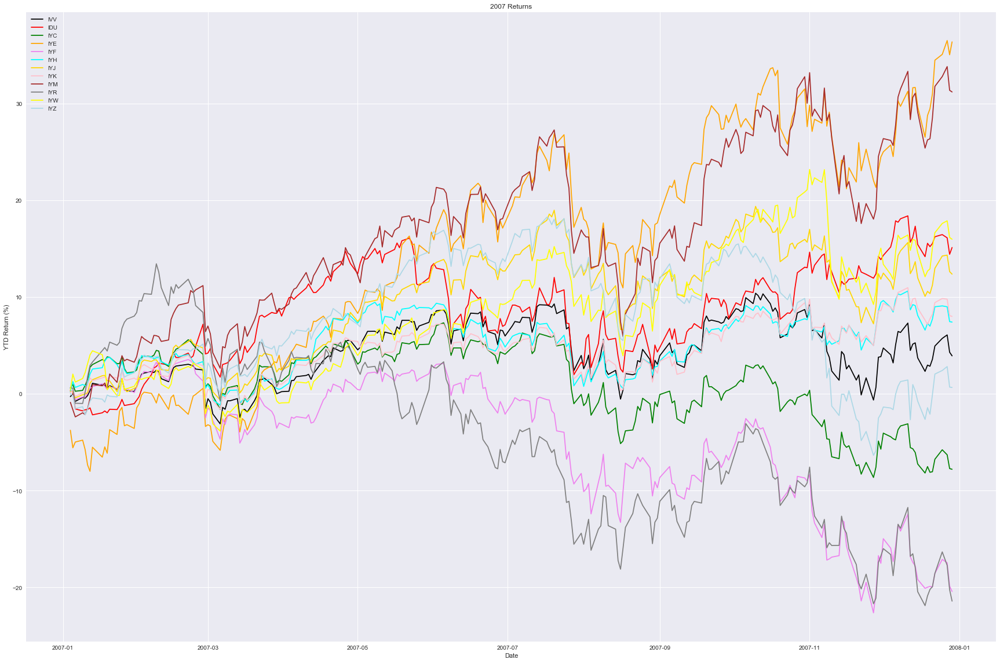

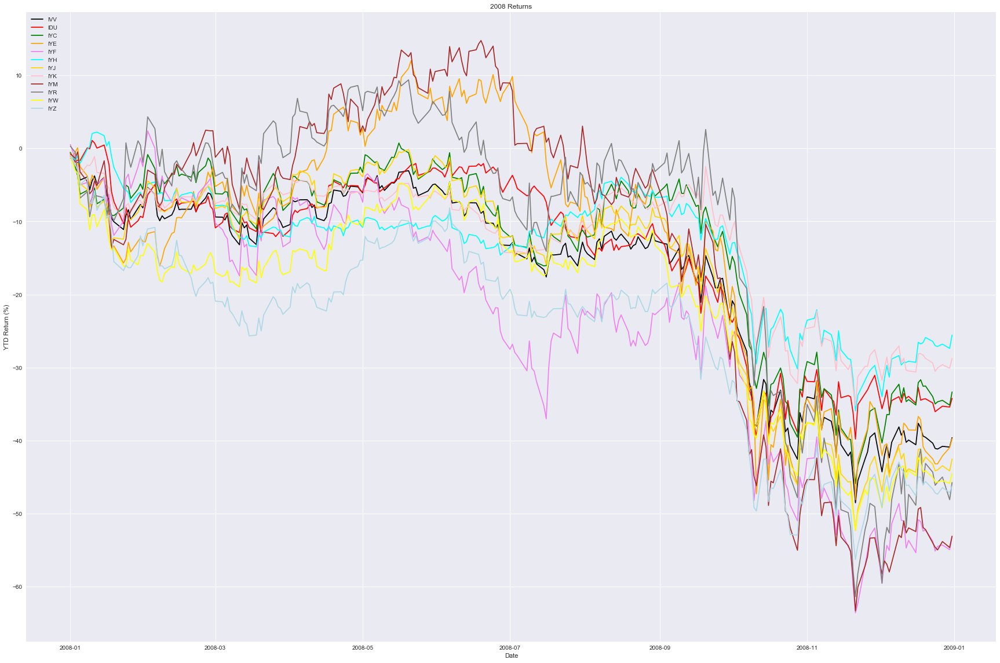

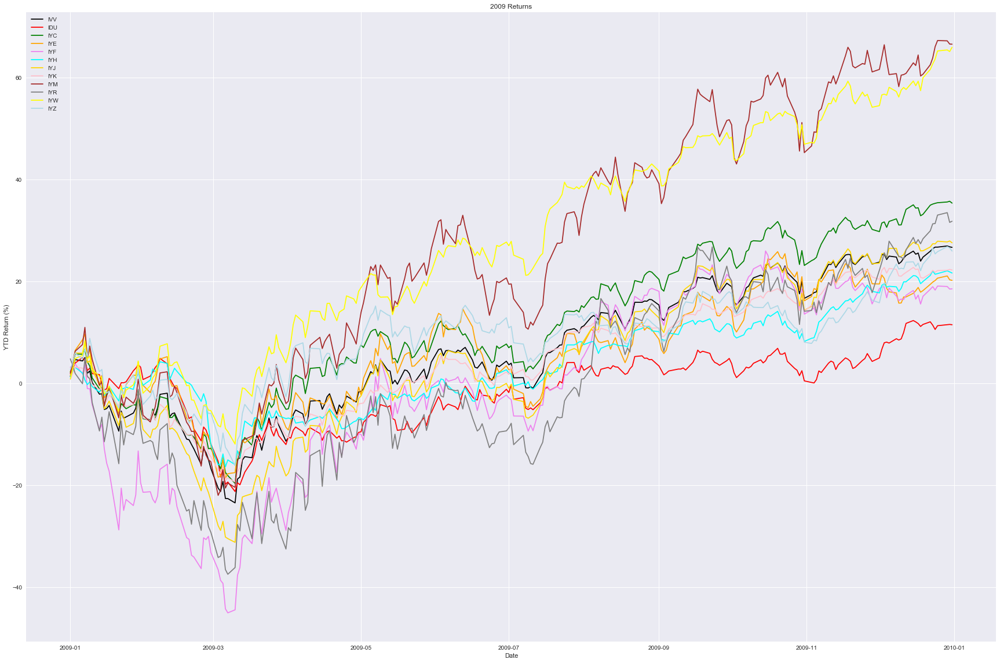

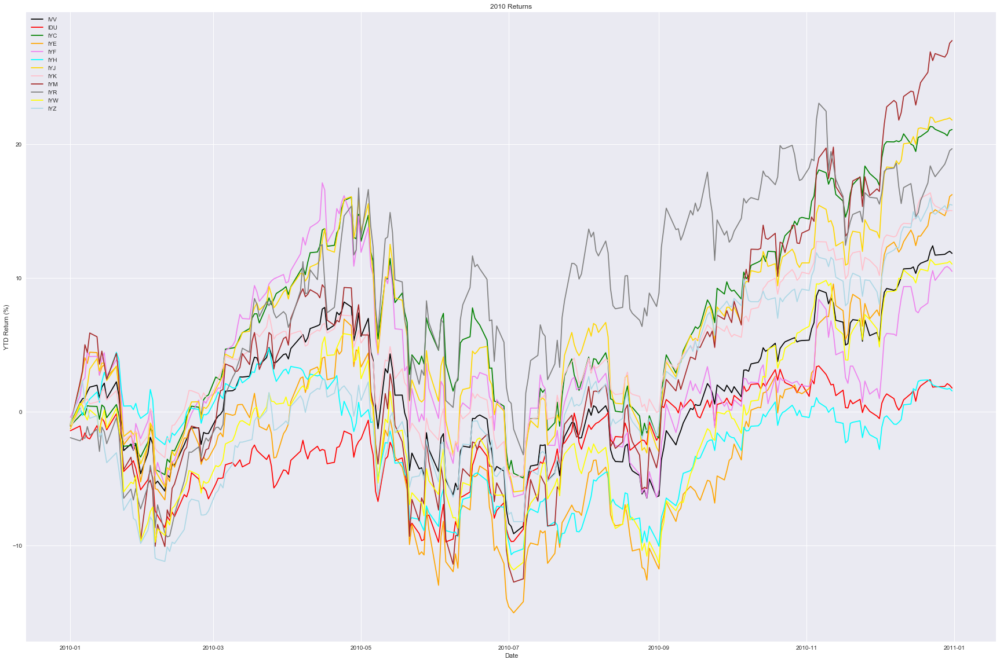

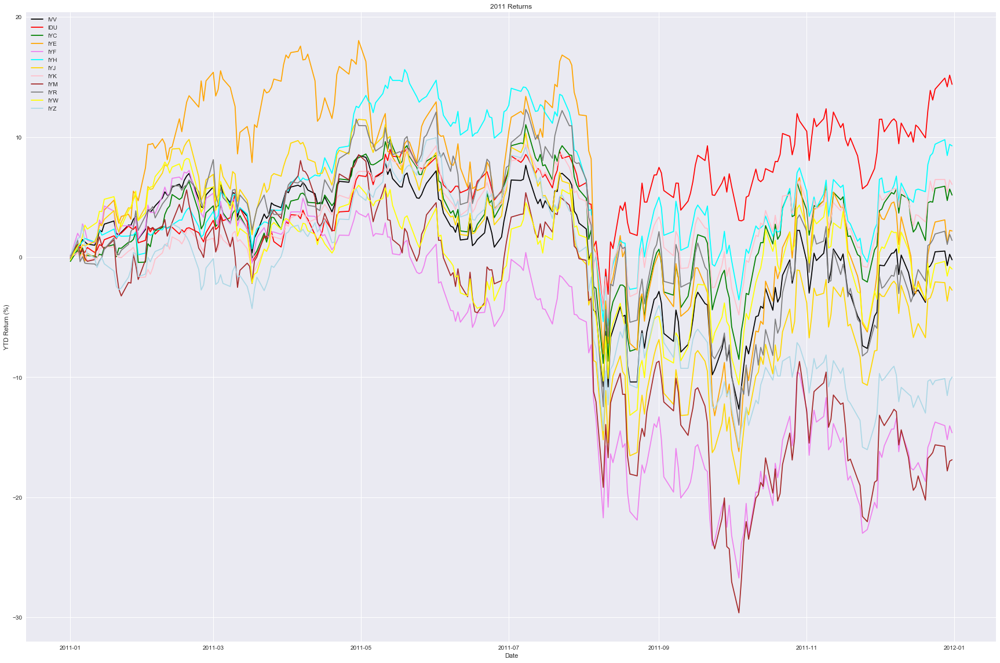

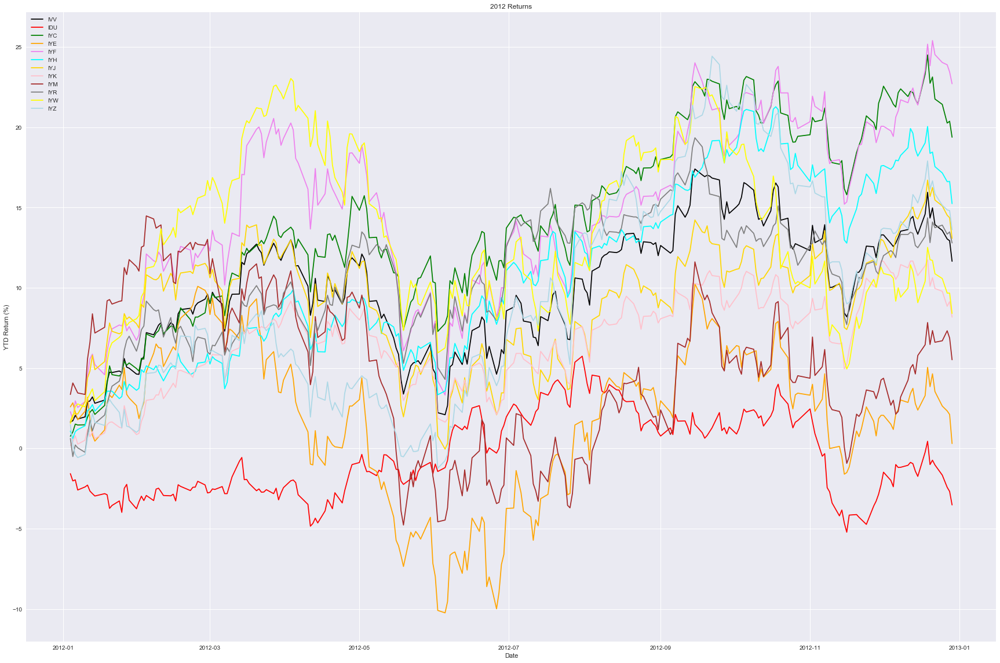

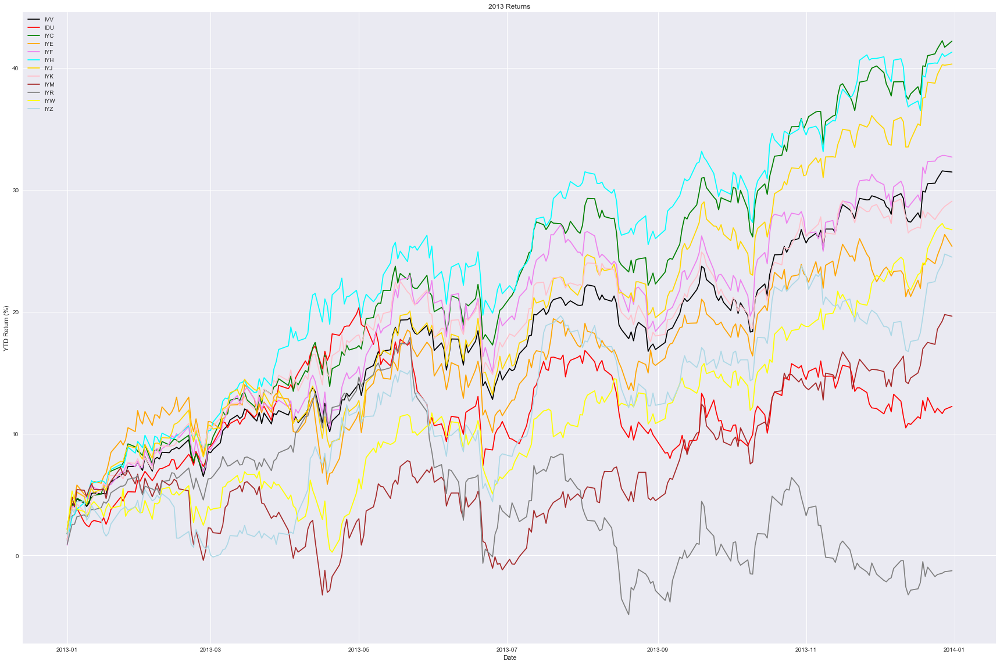

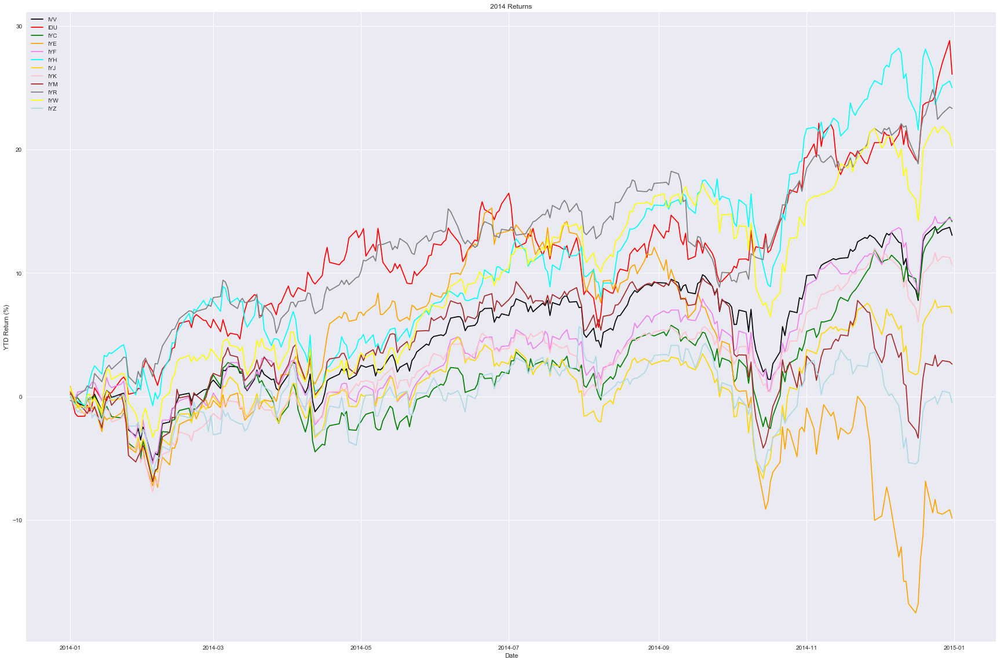

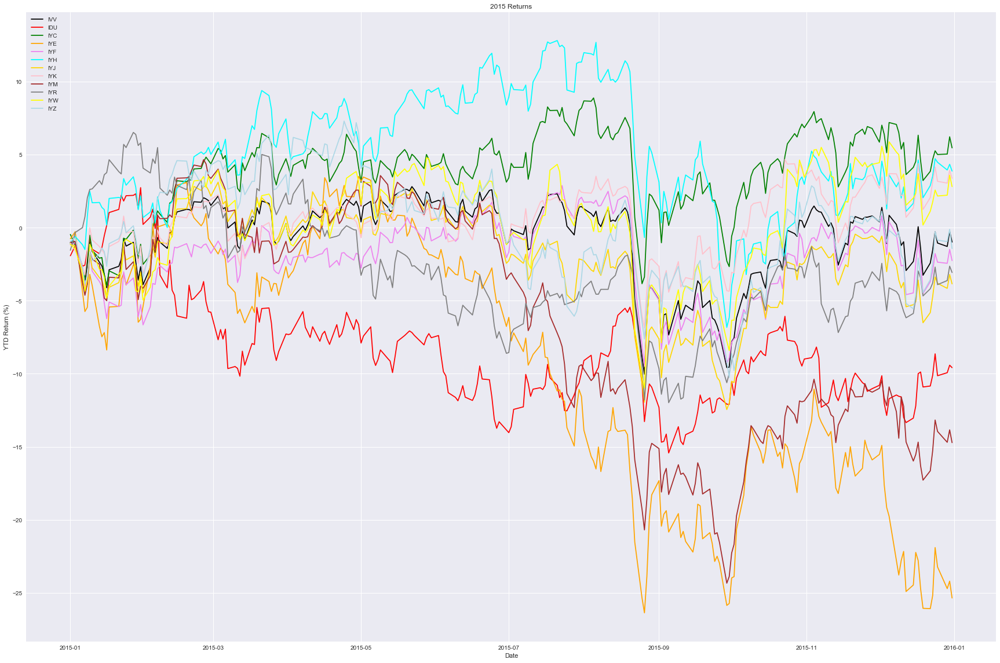

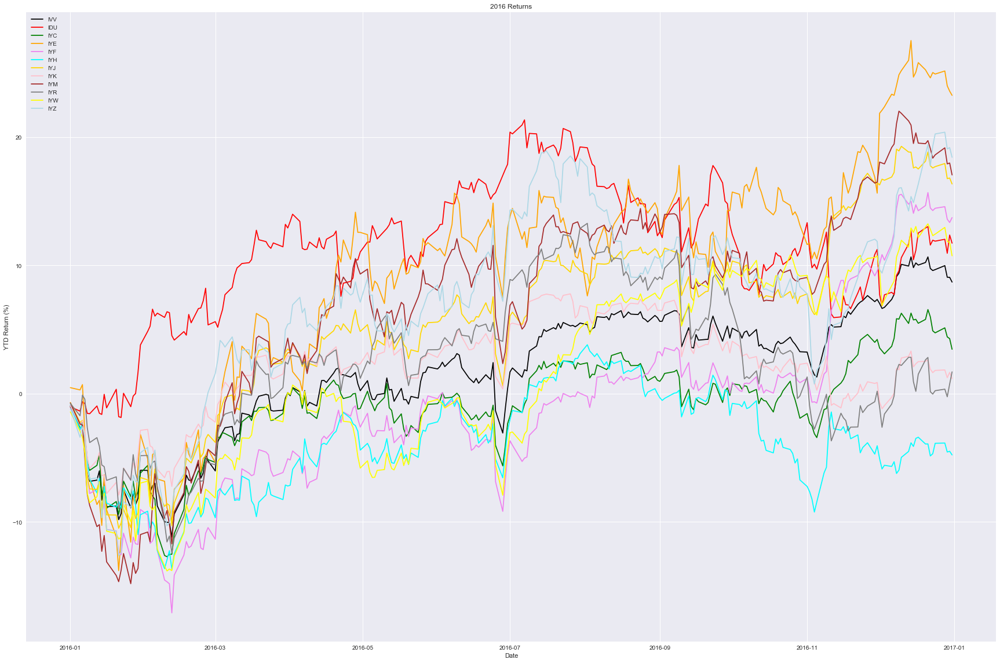

In [103]:
from cycler import cycler
color_cycle = cycler(color=['black','red','green','orange','violet','cyan','gold','pink','brown','grey','yellow','lightblue'])


df_daily_prices = df_etf_data.pivot_table(values='close',index='dateYYMD',columns='symbol')

groups_year2 = df_daily_prices.groupby(pd.TimeGrouper('A'))
for name,group in groups_year2:
    if (len(group)>1):
        df_ytd_return = pd.DataFrame()
        df_ytd_return['dateYYMD'] = group.index
        for symbol in symbols:
            #print(df_ytd_return.info())
            symbol_end_price = year_end_price[symbol][0]
            df_ytd_return[symbol] = group[symbol].values / symbol_end_price
        #print(df_ytd_return.head())
        y = (df_ytd_return.drop(['dateYYMD'],axis=1) - 1) * 100
        plt.rc('axes',prop_cycle=color_cycle)
        plt.figure(figsize=(30,20)) 
        for symbol in symbols:
            plt.plot(df_ytd_return['dateYYMD'],y[symbol],label=symbol)
        plt.legend(loc='upper left')
        plt.xlabel('Date')
        plt.ylabel('YTD Return (%)')
        title = str(name.year) + ' Returns'
        plt.title(title)
        plt.show()
    
    # capture the closing price in the last day of the year
    year_end_price = group.tail(1)
    
#df_daily_prices.plot()
#plt.show()

In [6]:
#split price data by symbol and year, then by year
groups = df_etf_data.groupby(['symbol',pd.TimeGrouper('A',key='dateYYMD')])
groups_year = df_etf_data.groupby(pd.TimeGrouper('A',key='dateYYMD'))

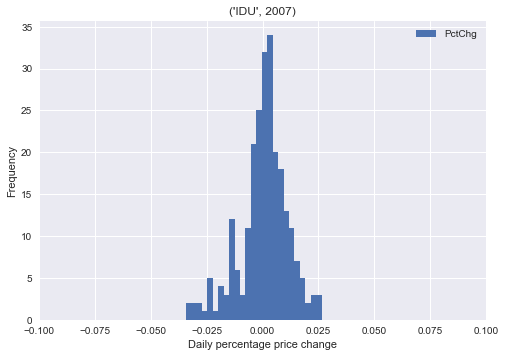

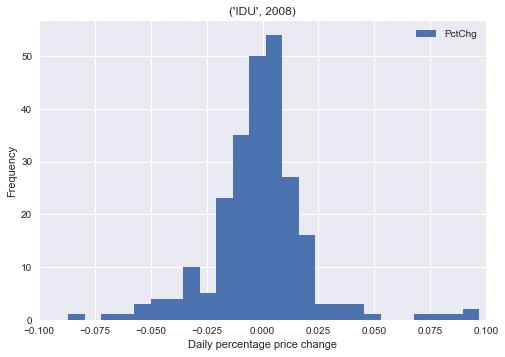

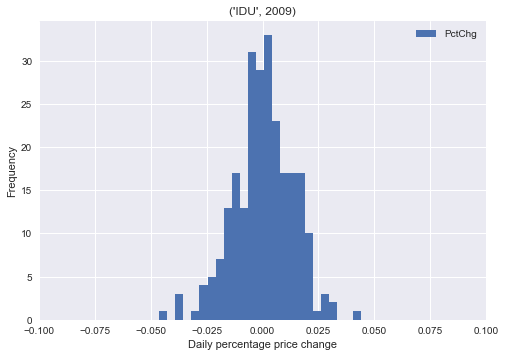

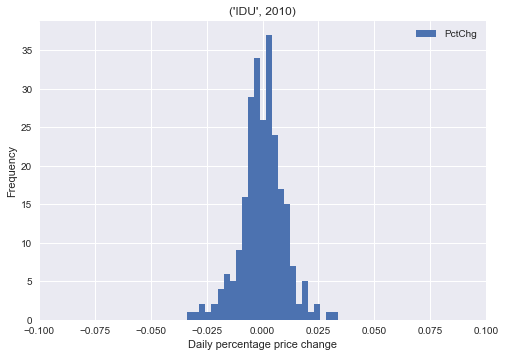

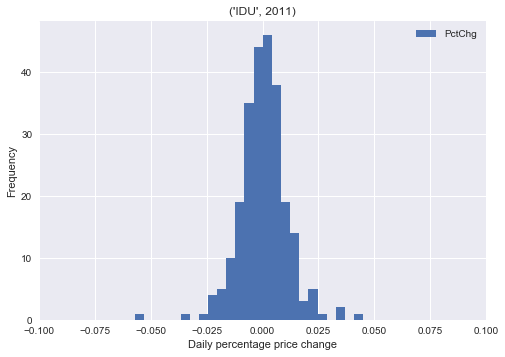

...

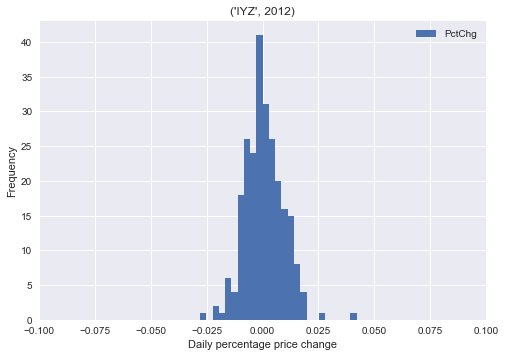

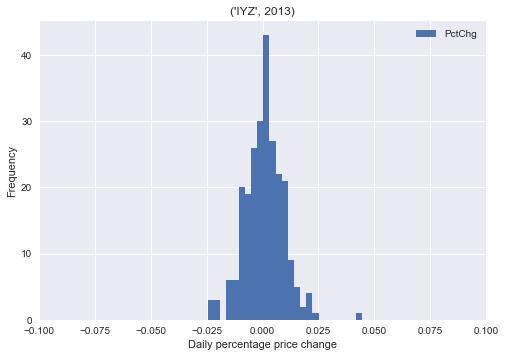

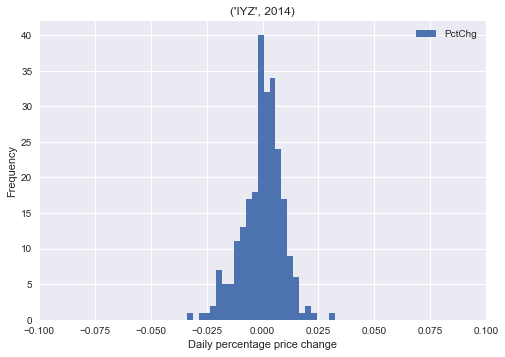

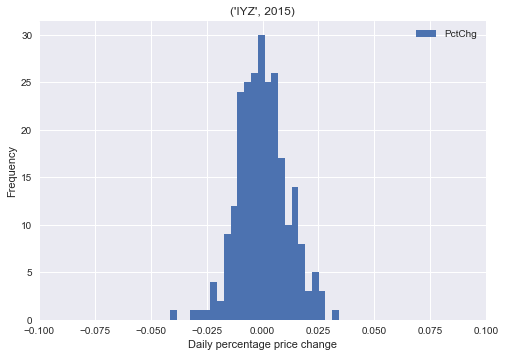

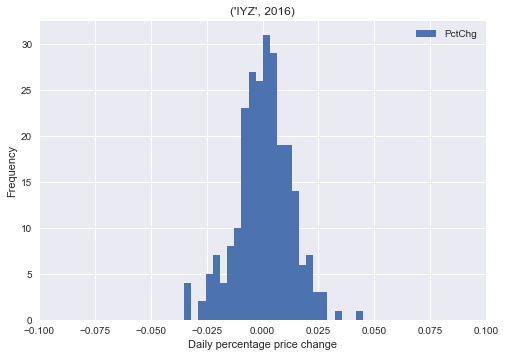

In [7]:
# create histograms to show distribution of daily returns by ETF and year

symbol_year = pd.DataFrame()
for symbol,group in groups:
    symbol_year[symbol[0],symbol[1].year] = group['PctChg']
    #print(group[['dateYYMD','PctChg']])
    if(len(group)!=1):
        group.plot(y='PctChg',kind='hist',bins=25)
        #sns.distplot(group['PctChg'],bins=20,hist=True,kde=True)
        plt.xlim(-0.1,0.1)
        plt.title((symbol[0],symbol[1].year))
        plt.xlabel('Daily percentage price change')
        plt.show()
    #print(group['PctChg'])
#symbol_year.plot(kind='hist',subplots=True,sharex=True,legend=False)
    #print(symbol,group.boxplot(column='PctChg',by='symbol'))
plt.show()

In [8]:
df_etf_year = groups.last()
df_etf_year.reset_index(inplace=True)
df_etf_year['year'] = df_etf_year['dateYYMD'].dt.year 
df_etf_closingprice_year = df_etf_year.set_index(['symbol','year']).drop(['dateYYMD'],axis=1)

In [9]:
dict_endprices = df_etf_closingprice_year['adjclose'].to_dict()

/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/in

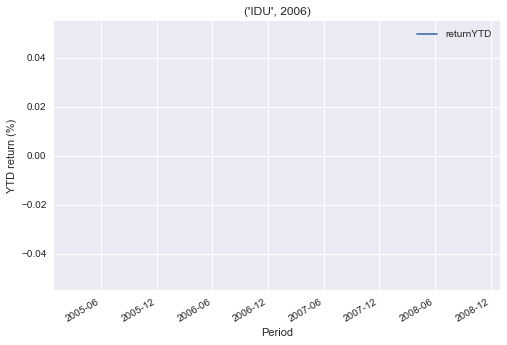

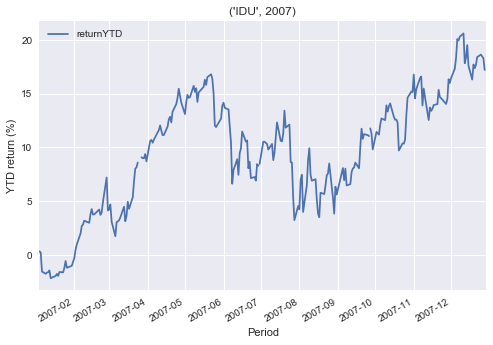

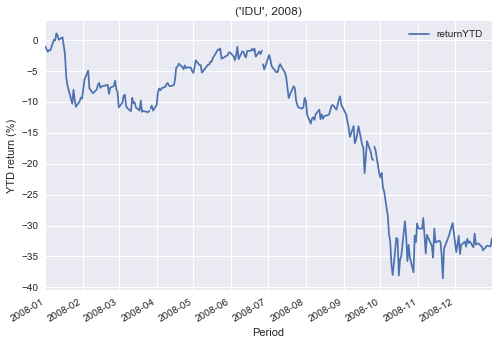

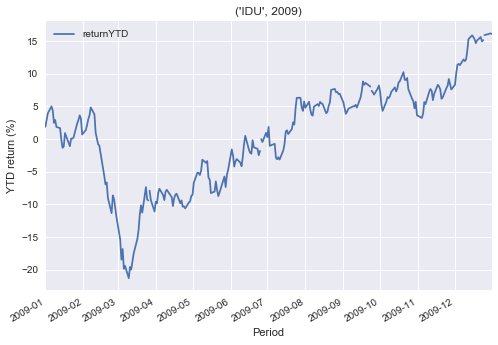

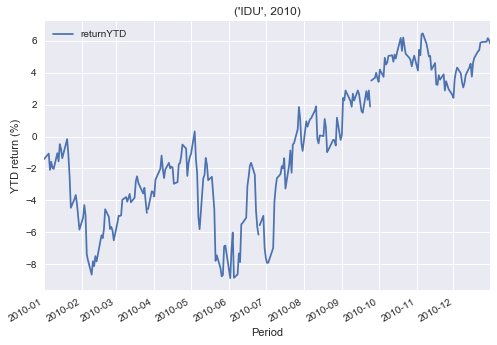

...

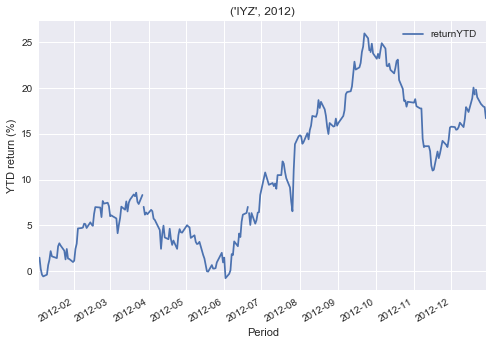

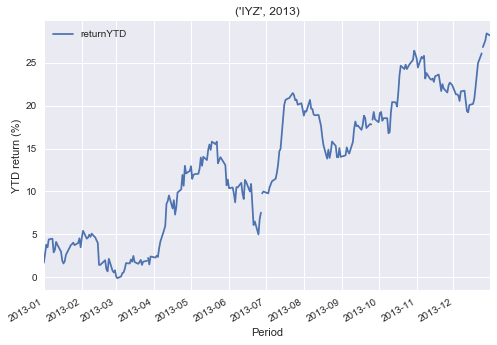

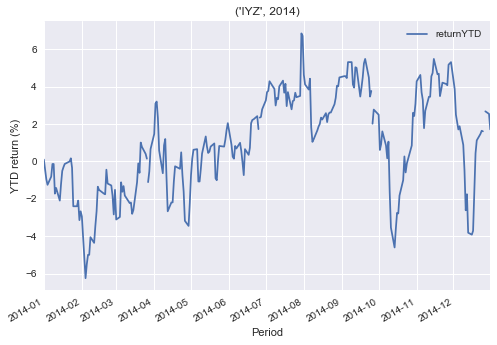

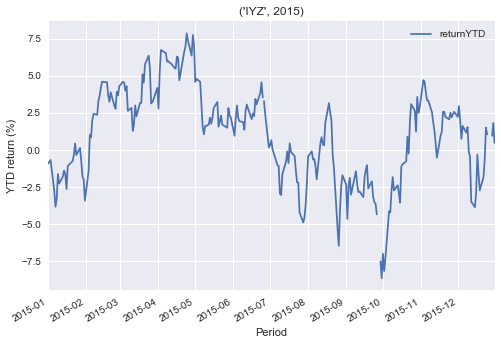

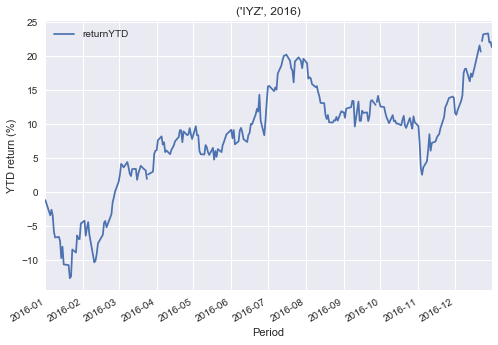

In [10]:
#get symbol returns by year

for name,group in groups:
    df_chart_data = group
    prev_year = name[1].year - 1
    df_chart_data['prevYear'] = prev_year
    df_chart_data['prevYearClose'] = dict_endprices.get((name[0],prev_year))
    df_chart_data['returnYTD'] = (df_chart_data['adjclose']/df_chart_data['prevYearClose'] - 1) * 100
    df_chart_data.plot(x='dateYYMD',y='returnYTD')

    plt.title((name[0],name[1].year))
    plt.xlabel('Period')
    plt.ylabel('YTD return (%)')
    
plt.show()

In [75]:
#get annual returns by symbol
prev_year = 0
curr_year = 0

for name,group in groups_year:
    #1) Calculate YTD return in first DF
    #2) Pivot first DF using YTD return values and pivot symbol column

    df_year_data = group
    df_year_data.reset_index(inplace=True)
    prev_year = name.year - 1
    df_year_data['prevYear'] = prev_year
    df_year_data['prevYearCloseLookup'] = zip(df_year_data['symbol'],df_year_data['prevYear'])
    print(len(df_year_data['prevYearCloseLookup'])) #.map(dict_endprices.get))
    #print([(row.symbol,row.prevYear) for idx,row in df_year_data.iterrows()])
    #df_year_data[['symbol','prevYear']].applymap(dict_endprices.get)
    df_year_data['returnYTD'] = (df_year_data['adjclose']/df_year_data['prevYearClose'] - 1) * 100
    
    print(df_year_data.head())
    #pivot
    #df_year_data_pivot = pd.pivot_table(groups_year,values='returnYTD',index='dateYYMD',columns='symbol')




12


/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Derek/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


KeyError: 'prevYearClose'